In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

import xarray as xr
import rioxarray
import rasterio
import richdem as rd
#import xdem
import cartopy.crs as ccrs
from pyproj import CRS

from osgeo import gdal
import inspect
import os

import random
from scipy.spatial import distance

# DTM attributes

In [2]:
# function for computing terrain attributes (slope, aspect, profile curvature)

def compute_terrainattr(ds, attr='slope_degrees', method=None):

    dem = rd.rdarray(ds.values, no_data=-9999)
    dem.projection = ds.rio.crs.to_string()
    dem.geotransform = ds.rio.transform().to_gdal()

    if method == None:
        att = rd.TerrainAttribute(dem, attrib=attr)
        print (f'{attr} calculated')
    elif method == 'D8':
        dem = rd.FillDepressions(dem, epsilon=True, in_place=False)
        print ('depressions in dem filled')
        att = rd.FlowAccumulation(dem, method=method)
        print (f'flow accumulation calculated with method {method}')
        
    return att

In [81]:
fn_in = 'data_in/dtm.tif'
fn_out = 'data_out/dtm_attr_noflowacc.nc'
fn_out = 'data_out/dtm_attr_noflowacc_updated.nc'

if not os.path.exists(fn_out):
    
    print ('assigning DTM attributes, this takes some time')
    
    # open DTM
    dtm = rioxarray.open_rasterio(fn_in)
    
    # define geospatial data
    crs = dtm.rio.crs
    transform = dtm.rio.transform()
    bounds = dtm.rio.bounds()

    # reorganise array
    dtm = xr.Dataset({'elevation': dtm[0]})
    
    # compute terrain attributes from DTM
    slope = compute_terrainattr(dtm['elevation'], 'slope_degrees')
    profcurv = compute_terrainattr(dtm['elevation'], 'profile_curvature')
    plancurv = compute_terrainattr(dtm['elevation'], 'planform_curvature')
    aspect = compute_terrainattr(dtm['elevation'], 'aspect')
    #flowacc = compute_terrainattr(dtm['elevation'], method='D8')

    # redefine aspect
    aspect_sin = np.sin(np.deg2rad(aspect))
    aspect_cos = np.cos(np.deg2rad(aspect))

    # reorganise array
    dtm['slope'] = (('y', 'x'), slope)
    dtm['profcurv'] = (('y', 'x'), profcurv)
    dtm['plancurv'] = (('y', 'x'), plancurv)
    dtm['aspect_sin'] = (('y', 'x'), aspect_sin)
    dtm['aspect_cos'] = (('y', 'x'), aspect_cos)
    #dtm['flowacc'] = (('y', 'x'), flowacc)
    
    # define TPI
    if not os.path.exists('data_out/TPI.tif'):
        tpi = gdal.DEMProcessing('data_out/TPI.tif', gdal.Open(fn_in), 'TPI', computeEdges=True)
    tpi_data = rioxarray.open_rasterio('data_out/TPI.tif')
    dtm['tpi'] = tpi_data[0] # include TPI in DTM attributes
    
    # define TRI
    if not os.path.exists('data_out/TRI.tif'):
        tri = gdal.DEMProcessing('data_out/TRI.tif', gdal.Open(fn_in), 'TRI', computeEdges=True)
    tri_data = rioxarray.open_rasterio('data_out/TRI.tif')
    dtm['tri'] = tri_data[0] # include TRI in DTM attributes

    # ensure geospatial data remains
    dtm.rio.set_crs(crs, inplace=True)
    dtm.attrs['transform'] = transform.to_gdal()  # Store transform as GDAL string
    dtm.attrs['bounds'] = bounds  # Store bounds in dataset attributes
    
    # save dtm attributes to new tif file
    dtm.to_netcdf('data_out/dtm_attr_noflowacc.nc')
    #dtm[['plancurv','profcurv']].to_netcdf('data_out/curvature.nc')
    #dtm[['aspect_sin','aspect_cos']].to_netcdf('data_out/aspect.nc')
    
else:
    
    print ('opening DTM attributes')
    
    dtm = xr.open_dataset(fn_out)
    #elevation = xr.open_dataset('data_out/dtm.nc')
    #curvature = xr.open_dataset('data_out/curvature.nc')

    
dtm.rio.crs

opening DTM attributes


In [97]:
#dtm.rio.set_crs(crs, inplace=True)
#dtm.attrs['transform'] = transform.to_gdal()  # Store transform as GDAL string
#dtm.attrs['bounds'] = bounds  # Store bounds in dataset attributes
dtm.rio.crs, dtm.rio.transform(), dtm.rio.bounds()

(None,
 Affine(35425.0, 5.0, 0.0,
        6996005.0, 0.0, -5.0),
 (17715.0, 6996002.5, 323145.0, 6635997.5))

In [ ]:
# add FLOW_ACC and SPI to DTM attributes

if not os.path.exists('data_out/dtm_attr_flowacc.nc'):
    
    flowacc = compute_terrainattr(dtm['elevation'], method='D8')
    print ('flow accumulation calculated')
    dtm['flowacc'] = (('y', 'x'), flowacc)

    
    
    def calculate_spi(flow_acc_block, slope_block):
        return np.log((flow_acc_block*1*1 + 0.001) * np.tan(slope_block + 0.001))
        
    spi = calculate_spi(flowacc, dtm['slope']*np.pi/180)
    print ('spi calculated')
    dtm['spi'] = (('y', 'x'), spi)
    
    # save flowacc and spi attributes
    dtm[['elevation', 'slope', 'flowacc','spi']].to_netcdf('data_out/dtm_attr_flowacc.nc')
    print ('flowacc and spi attributes saved to file')

else:
    print ('opening and assigning FLOW_ACC and SPI')
    dtm_flowacc = xr.open_dataset('data_out/dtm_attr_flowacc.nc')
    dtm['flowacc'] = dtm_flowacc['flowacc']
    dtm['spi'] = dtm_flowacc['spi']
    #dtm = dtm[['slope']]

opening and assigning FLOW_ACC and SPI


In [3]:
dtm_flowacc = xr.open_dataset('data_out/dtm_attr_flowacc.nc')
dtm_flowacc['flowacc']

<xarray.DataArray 'flowacc' (y: 3002, x: 3002)> Size: 72MB
[9012004 values with dtype=float64]
Coordinates:
    band     int64 8B ...
  * x        (x) float64 24kB 3.543e+04 3.543e+04 ... 5.043e+04 5.043e+04
  * y        (y) float64 24kB 6.711e+06 6.711e+06 ... 6.696e+06 6.696e+06

In [11]:
# assign projected coordinate system
#dtm = dtm.rio.write_crs('EPSG:25833')
#dtm = dtm.rio.write_crs('EPSG:4326')

dtm_tif.rio.crs

CRS.from_wkt('PROJCS["ETRS89 / UTM zone 33N",GEOGCS["ETRS89",DATUM["European_Terrestrial_Reference_System_1989",SPHEROID["GRS 1980",6378137,298.257222101004,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6258"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4258"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","25833"]]')

# Forest

In [11]:
def get_variable_name(var):
    callers_local_vars = inspect.currentframe().f_back.f_locals.items()
    return [name for name, val in callers_local_vars if val is var][0]

In [84]:
if not os.path.exists('data_out/forest.nc'):
    
    print ('assigning forest attributes')
    
    # load forest data
    
    treetype = rioxarray.open_rasterio('data_in/SRRTRESLAG.tif')
    canopy = rioxarray.open_rasterio('data_in/SRRKRONEDEK.tif')
    treeheight = rioxarray.open_rasterio('data_in/SRRMHOYDE.tif')
    treenumber = rioxarray.open_rasterio('data_in/SRRTREANTALL.tif')
    treevolume = rioxarray.open_rasterio('data_in/SRRVOLMB.tif')
    #biomass = rioxarray.open_rasterio('data_in/SRBMO.tif')

    # reorganising array
    #dtm_data = xr.Dataset({'elevation': dtm_data[0]})
    
    
    
    # double-check CRS
    
    if dtm.rio.crs == treetype.rio.crs == canopy.rio.crs:
        print ('CRS are equal.')
        crs = dtm.rio.crs
    else:
        print ('DTM: ', dtm.rio.crs)
        print ('TREETYPE: ', treetype.rio.crs)
        print ('CANOPY: ', canopy.rio.crs)
        raise ValueError("CRS are not equal.")
        
        
        
    # assign and save forest attributes
        
    forest = xr.Dataset()

    for var in [treetype, canopy, treeheight, treenumber, treevolume]:
        print (get_variable_name(var))
        forest[get_variable_name(var)] = var[0].where((var.x >= dtm['x'].min()) & (var.y >= dtm['y'].min()) 
                                        & (var.x <= dtm['x'].max()) & (var.y <= dtm['y'].max()), drop=True)#})
        
    forest.to_netcdf('data_out/forest.nc')
    
else:
    
    print ('opening forest attributes')
    
    forest = xr.open_dataset('data_out/forest.nc')

opening forest attributes


# Forest loss

In [90]:
if not os.path.exists('data_out/forestloss.nc'):
    
    print ('assigning forest loss attributes')
    
    fl1 = rioxarray.open_rasterio('data_in/forestloss/Hans_GFC-2022_lossyear01.tif')
    fl2 = rioxarray.open_rasterio('data_in/forestloss/Hans_GFC-2022_lossyear02.tif')
    
    fl1 = fl1.rio.reproject(CRS.from_epsg(25833))
    fl2 = fl2.rio.reproject(CRS.from_epsg(25833))
    
    forestloss = xr.concat([fl1, fl2], dim="x")
    forestloss = forestloss[0].where((forestloss.x >= dtm['x'].min()) & (forestloss.y >= dtm['y'].min()) 
                               & (forestloss.x <= dtm['x'].max()) & (forestloss.y <= dtm['y'].max()), drop=True)
    
    forestloss.to_netcdf('data_out/forestloss.nc')
    
else:
    
    print ('opening forest loss attributes')
    
    forestloss = xr.open_dataset('data_out/forestloss.nc')

opening forest loss attributes


In [91]:
forestloss

<xarray.Dataset> Size: 3GB
Dimensions:                        (y: 28739, x: 13406)
Coordinates:
  * y                              (y) float64 230kB 6.657e+06 ... 6.996e+06
    band                           int64 8B ...
  * x                              (x) float64 107kB 3.543e+04 ... 3.054e+05
    spatial_ref                    int64 8B ...
Data variables:
    __xarray_dataarray_variable__  (y, x) float64 3GB ...

# Landforms

In [28]:
if not os.path.exists('data_out/landforms.nc'):
    
    print ('defining landform attributes')
    
    tpi300 = rioxarray.open_rasterio('data_in/tpi300_stdi.tif')
    tpi2000 = rioxarray.open_rasterio('data_in/tpi2000_stdi.tif')
    
    tpi300 = tpi300.where(tpi300 != -2147483648, np.nan)
    tpi2000 = tpi2000.where(tpi2000 != -2147483648, np.nan)
    
    landforms = xr.full_like(tpi300, np.nan)
    
    conditions = [
        (((tpi300 > -100) & (tpi300 < 100)) & ((tpi2000 > -100) & (tpi2000 < 100)) & (dtm['slope'] <= 5), 5),
        (((tpi300 > -100) & (tpi300 < 100)) & ((tpi2000 > -100) & (tpi2000 < 100)) & (dtm['slope'] > 5), 6), # >5 instead?
        (((tpi300 > -100) & (tpi300 < 100)) & (tpi2000 >= 100), 7),
        (((tpi300 > -100) & (tpi300 < 100)) & (tpi2000 <= -100), 4),
        ((tpi300 <= -100) & ((tpi2000 > -100) & (tpi2000 < 100)), 2),
        ((tpi300 >= 100) & ((tpi2000 > -100) & (tpi2000 < 100)), 9),
        ((tpi300 <= -100) & (tpi2000 >= 100), 3),
        ((tpi300 <= -100) & (tpi2000 <= -100), 1),
        ((tpi300 >= 100) & (tpi2000 >= 100), 10),
        ((tpi300 >= 100) & (tpi2000 <= -100), 8)
    ]
    
    for condition, category in conditions:
        landforms = landforms.where(~condition, category)
        
    landforms = xr.Dataset({'landforms': landforms[0]})

    landforms.to_netcdf('data_out/landforms.nc')
    
else:
    
    print ('opening landform attributes')
    
    landforms = xr.open_dataset('data_out/landforms.nc')
    
landforms = landforms.rio.write_crs("EPSG:25833")

#landforms.rio.to_raster('landforms.tif', dtype='float32', nodata=np.nan)

opening landform attributes


# Ground water

In [6]:
print ('extracting ground water data')
    
groundwater = rioxarray.open_rasterio('data_in/gwt_2023_08_07_rel_dailymean30y.tif')#grunnvann_normalized.tif')

#xx_gw, yy_gw = np.meshgrid(groundwater['x'], groundwater['y'])

groundwater = groundwater[0].where((groundwater.x >= dtm['x'].min()) & (groundwater.y >= dtm['y'].min()) 
                                 & (groundwater.x <= dtm['x'].max()) & (groundwater.y <= dtm['y'].max()), drop=True)

groundwater = xr.Dataset({'groundwater': groundwater})

extracting ground water data


# Precipitation

In [21]:
print ('extracting precipitation data')

relprecip = rioxarray.open_rasterio('data_in/hans3_rel_normal.tif')
relprecip = relprecip.where(relprecip > 0, np.nan)

precip = rioxarray.open_rasterio('data_in/hans_080823-100823.tif')
precip = precip.where(precip > 0, np.nan)

# define x,y increments to include x,y values one cell outside the dtm

xstep = abs((relprecip['x'][1]-relprecip['x'][0]).values)
ystep = abs((relprecip['y'][1]-relprecip['y'][0]).values)

# extract subset similar to dtm domain

relprecip = relprecip[0].where((relprecip.x >= dtm['x'].min()-xstep) & (relprecip.y >= dtm['y'].min()-ystep) 
                             & (relprecip.x <= dtm['x'].max()+xstep) & (relprecip.y <= dtm['y'].max()+ystep), drop=True)
relprecip = xr.Dataset({'relprecip': relprecip})

precip = precip[0].where((precip.x >= dtm['x'].min()-xstep) & (precip.y >= dtm['y'].min()-ystep) 
                       & (precip.x <= dtm['x'].max()+xstep) & (precip.y <= dtm['y'].max()+ystep), drop=True)
precip = xr.Dataset({'precip': precip})

extracting precipitation data
EPSG:25833
EPSG:25833


In [19]:
#dtm_tif.rio.set_crs(crs, inplace=True)
#dtm_tif.attrs['transform'] = transform.to_gdal()  # Store transform as GDAL string
#dtm_tif.attrs['bounds'] = bounds  # Store bounds in dataset attributes

relprecip.rio.crs

CRS.from_wkt('PROJCS["ETRS89 / UTM zone 33N",GEOGCS["ETRS89",DATUM["European_Terrestrial_Reference_System_1989",SPHEROID["GRS 1980",6378137,298.257222101004,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6258"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4258"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","25833"]]')

In [3]:

max_precip = xr.open_dataset('data_out/max_precip_original.nc')
    
#precip_1h = precip_1h.rio.write_crs("EPSG:25833")

#precip_1h = rioxarray.open_rasterio('data_out/max_precip_1h.tif')
#precip_1h = precip_1h.where(precip_1h[0] > 0, np.nan)

# define x,y increments to include x,y values one cell outside the dtm
xstep = abs((max_precip['x'][0,1]-max_precip['x'][0,0]).values) #abs((precip_1h['x'][1]-precip_1h['x'][0]).values)
ystep = abs((max_precip['y'][1,0]-max_precip['y'][0,0]).values) #abs((precip_1h['y'][1]-precip_1h['y'][0]).values)

#xstep = abs((max_precip['x'][1]-max_precip['x'][0]).values) #abs((precip_1h['x'][1]-precip_1h['x'][0]).values)
#ystep = abs((max_precip['y'][1]-max_precip['y'][0]).values) #abs((precip_1h['y'][1]-precip_1h['y'][0]).values)

# extract subset similar to dtm domain
max_precip = max_precip.where((max_precip.x >= dtm['x'].min()-xstep) & (max_precip.y >= dtm['y'].min()-ystep) 
                            & (max_precip.x <= dtm['x'].max()+xstep) & (max_precip.y <= dtm['y'].max()+ystep), drop=True)


#precip_1h = xr.Dataset({'precip_1h': precip_1h[0]})

In [48]:
original = xr.open_dataset('data_out/precip_1h/met_analysis_1_0km_nordic_20230806T00Z.nc')
#original = original.squeeze('time')
original.rio.crs, original.rio.transform(), original.rio.bounds()

(None,
 Affine(1000.0, 0.0, -897942.1875,
        0.0, 1000.0, -1104822.0),
 (-897942.1875, -1104822.0, 898057.8125, 1216178.0))

In [2]:
untransformed = xr.open_dataset('data_out/max_precip_untransformed_updated.nc')#precip_1h/met_analysis_1_0km_nordic_20230806T00Z.nc')
#original = original.squeeze('time')
untransformed.rio.crs, untransformed.rio.transform(), untransformed.rio.bounds()

(None,
 Affine(1000.0, 0.0, -897942.1875,
        0.0, 1000.0, -1104822.0),
 (-897942.1875, -1104822.0, 898057.8125, 1216178.0))

In [6]:
untransformed['precip_3h'].values#['y'] = untransformed['y'][::-1]

array([[0.26509538, 0.33249536, 0.4032515 , ..., 2.661616  , 2.5284452 ,
        2.322977  ],
       [0.32414073, 0.39938375, 0.47282135, ..., 2.4994798 , 2.3242476 ,
        2.099573  ],
       [0.38969874, 0.4717196 , 0.5452059 , ..., 2.2758439 , 2.069907  ,
        1.8386104 ],
       ...,
       [0.16246426, 0.17187415, 0.17999628, ..., 1.747044  , 1.7159706 ,
        1.6835407 ],
       [0.16323797, 0.17296243, 0.18138811, ..., 1.4802448 , 1.4402305 ,
        1.3927929 ],
       [0.16401024, 0.17404915, 0.18277872, ..., 1.2134098 , 1.187112  ,
        1.263033  ]], dtype=float32)

In [11]:
untransformed['precip_3h'] = untransformed['precip_3h'][::-1]#.values
untransformed['precip_1h'] = untransformed['precip_1h'][::-1]

In [12]:
untransformed.to_netcdf('data_out/max_precip_untransformed_yflipped.nc')

In [26]:
original = original.isel(time=0)
original['precip_3h'] = (['y', 'x'], untransformed['precip_3h'].values)
original['precip_1h'] = (['y', 'x'], untransformed['precip_1h'].values)
#original = original[['projection_lcc', 'forecast_reference_time', 'precip_1h', 'precip_3h']]#, 'precipitation_amount']]
original

<xarray.Dataset> Size: 100MB
Dimensions:                  (x: 1796, y: 2321)
Coordinates:
  * x                        (x) float32 7kB -8.974e+05 -8.964e+05 ... 8.976e+05
  * y                        (y) float32 9kB -1.104e+06 -1.103e+06 ... 1.216e+06
    time                     datetime64[ns] 8B 2023-08-06
    latitude                 (y, x) float32 17MB ...
    longitude                (y, x) float32 17MB ...
Data variables:
    projection_lcc           int32 4B ...
    forecast_reference_time  datetime64[ns] 8B ...
    wind_speed_10m           (y, x) float32 17MB ...
    wind_direction_10m       (y, x) float32 17MB ...
    precip_3h                (y, x) float32 17MB 0.2651 0.3325 ... 1.187 1.263
    precip_1h                (y, x) float32 17MB 0.2651 0.3325 ... 1.185 1.262
Attributes: (12/15)
    Conventions:                   CF-1.0
    institution:                   Norwegian Meteorological Institute, met.no
    creator_url:                   met.no
    geospatial_lat_min:            51.0
    geospatial_lat_max:            88.0
    geospatial_lon_min:            -20.0
    ...                            ...
    source:                        meps
    summary:                       Based on model data from MEPS (MetCoOp-Ens...
    NCO:                           "4.5.4"
    history_of_appended_files:     Mon Jul  1 10:50:38 2019: Appended file te...
    history:                       Created 2023-08-06T00:14:49Z
    meps_forecast_reference_time:  1691269200

In [28]:
original['precip_1h'].attrs['units'] = 'mm'
original['precip_1h'].attrs['standard_name'] = 'max_precip_1h'
original['precip_1h'].attrs['grid_mapping'] = original['wind_speed_10m'].attrs.get('grid_mapping')

In [19]:
#original = original.drop_vars(list(original.data_vars)[2:-3])
original['precip_3h'].attrs['units'] = 'mm'
original['precip_3h'].attrs['standard_name'] = 'max_precip_3h'
original['precip_3h'].attrs['grid_mapping'] = original['wind_speed_10m'].attrs.get('grid_mapping')

In [46]:
original.to_netcdf('data_out/max_precip_untransformed_updated.nc')

In [20]:
radar = xr.open_dataset('data_out/max_precip_radar_untransformed.nc')#precip_1h/met_analysis_1_0km_nordic_20230806T00Z.nc')
#original = original.squeeze('time')
radar.rio.crs, radar.rio.transform(), radar.rio.bounds()

(None,
 Affine(1000.0, 0.0, -295500.0,
        0.0, -1000.0, 8124500.0),
 (-295500.0, 6255500.0, 1258500.0, 8124500.0))

In [32]:
radar_original = xr.open_dataset('data_out/norway.mos.sri-acrr-1h.noclass-clfilter-vpr-clcorr-block.utm33-1000.20230808.nc')#precip_1h/met_analysis_1_0km_nordic_20230806T00Z.nc')
#original = original.squeeze('time')
radar_original.rio.crs, radar_original.rio.transform(), radar_original.rio.bounds()

(None,
 Affine(1000.0, 0.0, -295500.0,
        0.0, -1000.0, 8124500.0),
 (-295500.0, 6255500.0, 1258500.0, 8124500.0))

In [75]:
#radar_original = radar_original.isel(time=0)
radar_original['precip_3h'] = (['Yc', 'Xc'], radar['precip_3h'].values)
radar_original['precip_1h'] = (['Yc', 'Xc'], radar['precip_1h'].values)
radar_original

<xarray.Dataset> Size: 58MB
Dimensions:                 (nv: 2, Xc: 1554, Yc: 1869)
Coordinates:
    time                    datetime64[ns] 8B 2023-08-08
  * Xc                      (Xc) float32 6kB -2.95e+05 -2.94e+05 ... 1.258e+06
  * Yc                      (Yc) float32 7kB 8.124e+06 8.123e+06 ... 6.256e+06
    lon                     (Yc, Xc) float32 12MB ...
    lat                     (Yc, Xc) float32 12MB ...
Dimensions without coordinates: nv
Data variables:
    time_bnds               (nv) datetime64[ns] 16B ...
    projection_utm          int32 4B ...
    mosaic_info             int32 4B ...
    lwe_precipitation_rate  (Yc, Xc) float32 12MB ...
    precip_3h               (Yc, Xc) float32 12MB nan nan nan ... nan nan nan
    precip_1h               (Yc, Xc) float32 12MB nan nan nan ... nan nan nan

In [76]:
radar_original['precip_1h'].attrs['units'] = 'mm'
radar_original['precip_1h'].attrs['standard_name'] = 'max_precip_1h'
radar_original['precip_1h'].attrs['grid_mapping'] = radar_original['lwe_precipitation_rate'].attrs.get('grid_mapping')
radar_original['precip_3h'].attrs['units'] = 'mm'
radar_original['precip_3h'].attrs['standard_name'] = 'max_precip_3h'
radar_original['precip_3h'].attrs['grid_mapping'] = radar_original['lwe_precipitation_rate'].attrs.get('grid_mapping')
radar_original, radar_original['precip_1h']

(<xarray.Dataset> Size: 58MB
 Dimensions:                 (nv: 2, Xc: 1554, Yc: 1869)
 Coordinates:
     time                    datetime64[ns] 8B 2023-08-08
   * Xc                      (Xc) float32 6kB -2.95e+05 -2.94e+05 ... 1.258e+06
   * Yc                      (Yc) float32 7kB 8.124e+06 8.123e+06 ... 6.256e+06
     lon                     (Yc, Xc) float32 12MB ...
     lat                     (Yc, Xc) float32 12MB ...
 Dimensions without coordinates: nv
 Data variables:
     time_bnds               (nv) datetime64[ns] 16B ...
     projection_utm          int32 4B ...
     mosaic_info             int32 4B ...
     lwe_precipitation_rate  (Yc, Xc) float32 12MB ...
     precip_3h               (Yc, Xc) float32 12MB nan nan nan ... nan nan nan
     precip_1h               (Yc, Xc) float32 12MB nan nan nan ... nan nan nan,
 <xarray.DataArray 'precip_1h' (Yc: 1869, Xc: 1554)> Size: 12MB
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [n

In [77]:
radar_original.to_netcdf('data_out/max_precip_radar_untransformed_updated.nc')


In [78]:
max_precip = xr.open_dataset('data_out/max_precip_original.nc')


In [13]:
#xx,yy = np.meshgrid(dtm['x'], dtm['y'])

indx = 5000
indy = 500
xstart = 0#40000
xend = -1#48000
ystart = 0#20000
yend = -1#28000

#xx = xx[xstart:xend:xind, ystart:yend:yind]
#yy = yy[xstart:xend:xind, ystart:yend:yind]

plt.figure(figsize=(8, 12))
#lf = plt.contourf(ds['x'], ds['y'], ds['precip_1h'])
lf = plt.contourf(max_precip['x'], max_precip['y'], max_precip['precip_1h'])
#plt.contour(xx[xstart:xend:indx, ystart:yend:indy], 
#            yy[xstart:xend:indx, ystart:yend:indy], 
#            dtm['elevation'].values[xstart:xend:indx, ystart:yend:indy],
#            #colors=cmap.terrain)#, 
#            cmap='terrain')
plt.scatter(landslide_points['x'], landslide_points['y'], c='firebrick', ec='k', s=20, zorder=1000)
plt.colorbar(lf, orientation='horizontal', label='Max 3 hour precipitation during Hans (mm)')
#plt.xlim(0, .5e6)
#plt.ylim(6.5e6, 7e6)
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

NameError: name 'max_precip' is not defined

<Figure size 800x1200 with 0 Axes>

In [15]:
from pyproj import Proj, transform

proj4_str = untransformed.projection_lcc.proj4
utm_proj = Proj('EPSG:25833')
original_proj = Proj(proj4_str)

x_1d = untransformed['x'].values
y_1d = untransformed['y'].values
X_2d, Y_2d = np.meshgrid(x_1d, y_1d)

x_transformed, y_transformed = transform(original_proj, utm_proj, X_2d, Y_2d)

/tmp/ipykernel_792597/2236900989.py:11: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x_transformed, y_transformed = transform(original_proj, utm_proj, X_2d, Y_2d)


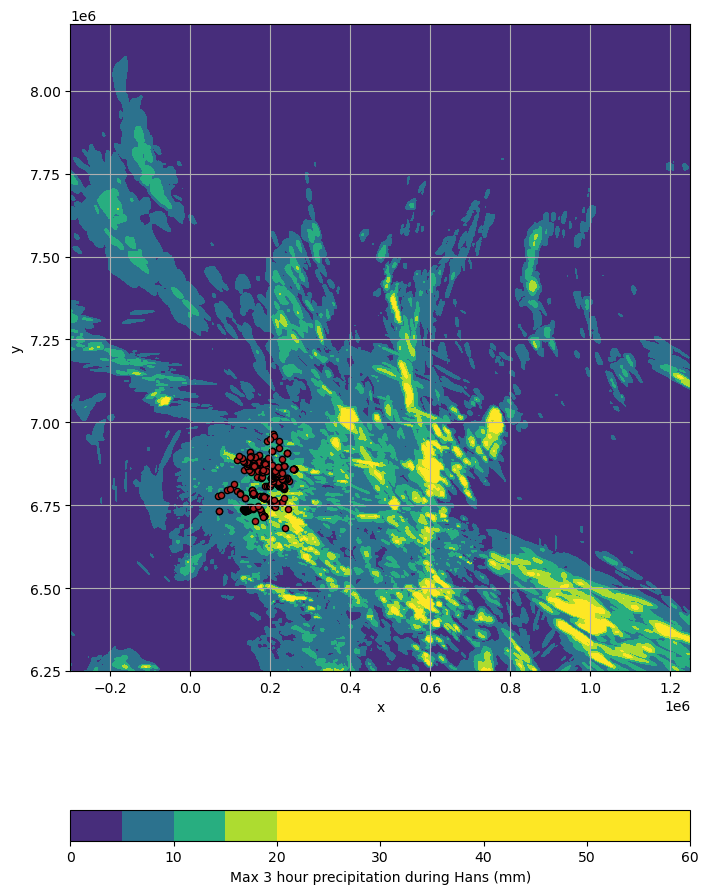

In [27]:
#xx,yy = np.meshgrid(dtm['x'], dtm['y'])

indx = 5000
indy = 500
xstart = 0#40000
xend = -1#48000
ystart = 0#20000
yend = -1#28000

#xx = xx[xstart:xend:xind, ystart:yend:yind]
#yy = yy[xstart:xend:xind, ystart:yend:yind]

plt.figure(figsize=(8, 12))
#lf = plt.contourf(ds['x'], ds['y'], ds['precip_1h'])

lf = plt.contourf(x_transformed, y_transformed, untransformed['precip_3h'].values, vmin=0, vmax=20, levels=12)

#lf = plt.contourf(untransformed['x'], untransformed['y'], untransformed['precip_3h'])
#plt.contour(xx[xstart:xend:indx, ystart:yend:indy], 
#            yy[xstart:xend:indx, ystart:yend:indy], 
#            dtm['elevation'].values[xstart:xend:indx, ystart:yend:indy],
#            #colors=cmap.terrain)#, 
#            cmap='terrain')
plt.scatter(landslide_points['x'], landslide_points['y'], c='firebrick', ec='k', s=20)
plt.colorbar(lf, orientation='horizontal', label='Max 3 hour precipitation during Hans (mm)')
plt.xlim(-.3e6, 1.25e6)
plt.ylim(6.25e6, 8.2e6)
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

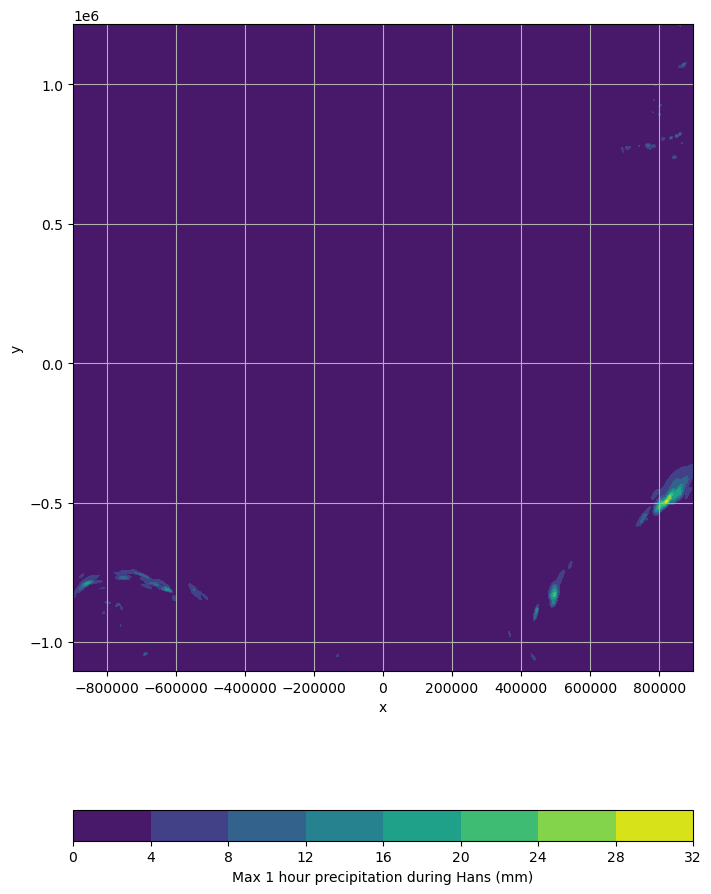

In [56]:
#xx,yy = np.meshgrid(dtm['x'], dtm['y'])

indx = 5000
indy = 500
xstart = 0#40000
xend = -1#48000
ystart = 0#20000
yend = -1#28000

#xx = xx[xstart:xend:xind, ystart:yend:yind]
#yy = yy[xstart:xend:xind, ystart:yend:yind]

plt.figure(figsize=(8, 12))
#lf = plt.contourf(ds['x'], ds['y'], ds['precip_1h'])
lf = plt.contourf(original['x'], original['y'], original['precipitation_amount'][0])
#plt.contour(xx[xstart:xend:indx, ystart:yend:indy], 
#            yy[xstart:xend:indx, ystart:yend:indy], 
#            dtm['elevation'].values[xstart:xend:indx, ystart:yend:indy],
#            #colors=cmap.terrain)#, 
#            cmap='terrain')
#plt.scatter(landslide_points['x'], landslide_points['y'], c='firebrick', ec='k', s=20)
plt.colorbar(lf, orientation='horizontal', label='Max 1 hour precipitation during Hans (mm)')
#plt.xlim(0, .5e6)
#plt.ylim(6.5e6, 7e6)
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

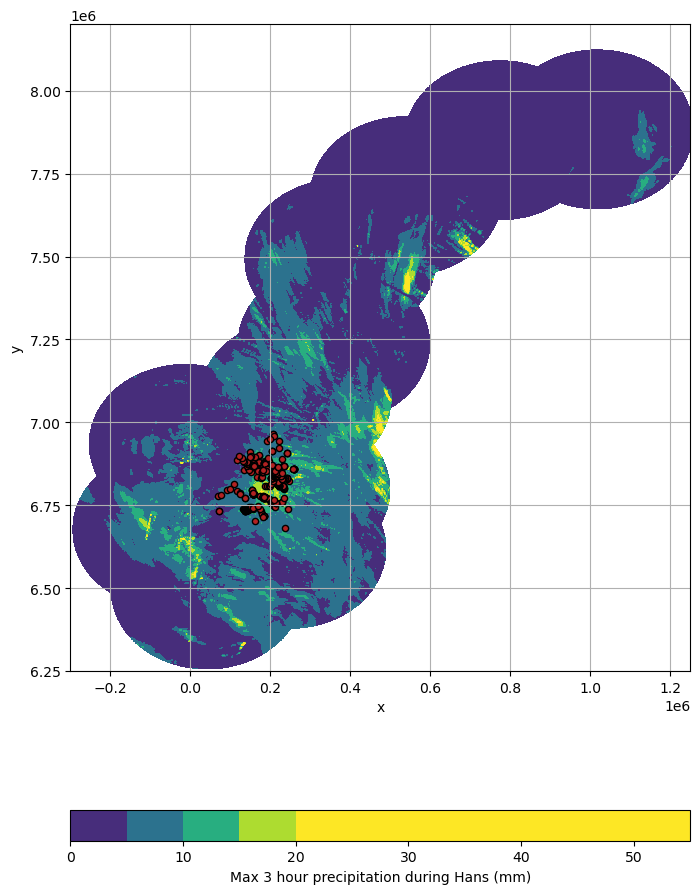

In [26]:
#xx,yy = np.meshgrid(dtm['x'], dtm['y'])

indx = 5000
indy = 500
xstart = 0#40000
xend = -1#48000
ystart = 0#20000
yend = -1#28000

#xx = xx[xstart:xend:xind, ystart:yend:yind]
#yy = yy[xstart:xend:xind, ystart:yend:yind]

plt.figure(figsize=(8, 12))
#lf = plt.contourf(ds['x'], ds['y'], ds['precip_1h'])
lf = plt.contourf(radar['Xc'], radar['Yc'], radar['precip_3h'], levels=10, vmin=0, vmax=20)
#plt.contour(xx[xstart:xend:indx, ystart:yend:indy], 
#            yy[xstart:xend:indx, ystart:yend:indy], 
#            dtm['elevation'].values[xstart:xend:indx, ystart:yend:indy],
#            #colors=cmap.terrain)#, 
#            cmap='terrain')
plt.scatter(landslide_points['x'], landslide_points['y'], c='firebrick', ec='k', s=20)
plt.colorbar(lf, orientation='horizontal', label='Max 3 hour precipitation during Hans (mm)')
plt.xlim(-.3e6, 1.25e6)
plt.ylim(6.25e6, 8.2e6)
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

In [17]:
landslide_points = pd.read_csv('data_in/landslide_attributes.csv')
landslide_points

,x,y
0,167684.092427,6.869836e+06
1,202368.366856,6.756325e+06
2,158702.483048,6.784227e+06
3,157124.804880,6.784814e+06
4,215783.821124,6.814926e+06
...,...,...
566,237604.732912,6.682559e+06
567,195374.092170,6.892372e+06
568,184470.181959,6.775512e+06
569,184485.636187,6.775494e+06


In [42]:
max_precip = max_precip.assign_coords(
    {
        'x': (('y', 'x'), transformed_x),
        'y': (('y', 'x'), transformed_y)
    }
)

# 3. Set x and y as coordinates (if necessary)
max_precip = max_precip.set_coords(['x', 'y'])

max_precip.attrs['transform'] = transform.to_gdal()  # Store the Affine transform
max_precip.attrs['bounds'] = (transformed_x.min(), transformed_y.min(), transformed_x.max(), transformed_y.max())



In [4]:
max_precip = xr.open_dataset('data_out/max_precip.nc')


# Assign attributes to landslide points and non-landslide points

### Landslide points first

In [39]:
# apply attributes to landslide df

def get_attr_for_coords(x, y, dtm, attr):
    att = dtm[attr].sel(x=x, y=y, method='nearest').values
    return att

In [38]:
def get_attr_for_2d_coords(xp, yp, xarray, attr):
    # Step 1: Calculate the squared differences
    # Make sure to flatten the x and y arrays so that we can compute distances easily
    x_flat = xarray['x'].values.flatten()   # Assuming ds['x'] is your 2D x array
    y_flat = xarray['y'].values.flatten()   # Assuming ds['y'] is your 2D y array
    
    # Calculate squared distances
    distances = (x_flat - xp)**2 + (y_flat - yp)**2
    
    # Step 2: Find the index of the minimum distance
    min_index = np.argmin(distances)
    
    # Convert this index back to 2D coordinates (i, j)
    nrows, ncols = xarray['x'].shape
    i = min_index // ncols
    j = min_index % ncols
    
    return max_precip[attr][i,j].values

In [28]:
if not os.path.exists('data_out/landslide_attributes.csv'):
    
    print ('assigning landslide attributes')
    
    # assign attributes necessary for creating control points

    landslide_points = pd.read_csv('data_in/landslide_attributes.csv')
    
    for attr in ['elevation','slope']:
        landslide_points[attr] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)

    landslide_points['relprecip'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], relprecip, attr='relprecip'), axis=1)

    # save minimised landslide attributes for definition of control points later
    
    if not os.path.exists('data_out/landslide_attributes_for_control_points.csv'):
        landslide_points.to_csv('data_out/landslide_attributes_for_control_points.csv', index=False)

    
    
    # assign other attributes

    for attr in ['profcurv', 'plancurv', 'aspect_sin', 'aspect_cos', 'tri', 'tpi']:
        landslide_points[attr] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)

    #for attr in ['spi', 'flowacc']:
    #    landslide_points[attr] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm_flowacc, attr=attr), axis=1)

    for attr in ['canopy', 'treetype', 'treeheight', 'treenumber', 'treevolume']:
        landslide_points[attr] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], forest, attr=attr), axis=1)

    landslide_points['groundwater'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], groundwater, attr='groundwater'), axis=1)
    landslide_points['precip'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], precip, attr='precip'), axis=1)
    landslide_points['max_precip_1h'] = landslide_points.apply(lambda row: get_attr_for_2d_coords(row['x'], row['y'], max_precip, attr='precip_1h'), axis=1)
    landslide_points['max_precip_3h'] = landslide_points.apply(lambda row: get_attr_for_2d_coords(row['x'], row['y'], max_precip, attr='precip_3h'), axis=1)

    landslide_points['landforms'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], landforms, attr='landforms'), axis=1)
    
    landslide_points.replace(-9999, np.nan, inplace=True)
    
    landslide_points.to_csv('data_out/landslide_attributes.csv', index=False)
    
else:
    
    print ('opening landslide attributes')
    
    landslide_points = pd.read_csv('data_out/landslide_attributes.csv')

opening landslide attributes


In [40]:
#landslide_points['max_precip_1h'] = landslide_points.apply(lambda row: get_attr_for_2d_coords(row['x'], row['y'], max_precip, attr='precip_1h'), axis=1)
#landslide_points['max_precip_3h'] = landslide_points.apply(lambda row: get_attr_for_2d_coords(row['x'], row['y'], max_precip, attr='precip_3h'), axis=1)
#landslide_points['plancurv'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr='plancurv'), axis=1)

In [41]:
landslide_points

,x,y,bedrock,deposit,soil,lu,elevation,slope,relprecip,profcurv,...,treevolume,groundwater,precip,flowacc,spi,twi,landforms,max_precip_1h,max_precip_3h,plancurv
0,167684.092427,6.869836e+06,402.0,11.0,43.0,50.0,1145.344292,28.583145,217.73248,1.467115,...,NaN,1.203390,128.7549,190.0,7.858630,9.073170,2.0,8.927802,12.528827,-1.5962445
1,202368.366856,6.756325e+06,403.0,11.0,44.0,30.0,314.786168,31.026085,165.13690,1.768647,...,246.0,1.538462,149.2426,387.0,8.668939,9.685662,4.0,7.37008,9.687027,1.1111465
2,158702.483048,6.784227e+06,402.0,81.0,44.0,30.0,1116.340327,36.514240,162.49648,-3.432729,...,29.0,1.209677,151.0358,591.0,9.300054,9.901330,6.0,6.715751,11.322396,0.6360214
3,157124.804880,6.784814e+06,402.0,81.0,44.0,30.0,877.925037,28.470516,163.10579,0.879604,...,75.0,1.477273,150.2709,207.0,7.939639,9.163550,1.0,6.5873423,11.113103,-2.9307666
4,215783.821124,6.814926e+06,143.0,11.0,44.0,30.0,711.032180,39.339016,134.08630,-0.968584,...,137.0,1.333333,146.7150,207239.0,15.261599,15.659408,1.0,10.025699,13.047401,2.8598435
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,237604.732912,6.682559e+06,104.0,50.0,44.0,30.0,145.610114,27.848473,100.56454,-3.249871,...,273.0,1.652174,86.2700,21.0,5.625349,6.901448,6.0,9.229095,10.047026,2.278942
567,195374.092170,6.892372e+06,403.0,12.0,44.0,30.0,657.761472,28.874530,184.74870,0.682395,...,134.0,1.666667,104.5866,1223.0,9.732733,10.923142,6.0,5.1505466,7.522057,0.75781506
568,184470.181959,6.775512e+06,402.0,12.0,44.0,21.0,660.114141,27.523922,132.39777,-0.374506,...,NaN,1.405405,114.9912,23.0,5.702553,7.006188,6.0,7.5520678,16.079552,-0.20893925
569,184485.636187,6.775494e+06,402.0,12.0,44.0,21.0,653.340420,24.726114,132.39777,-1.382138,...,NaN,1.405405,114.9912,104.0,7.087826,8.638707,6.0,7.5520678,16.079552,-0.7508683


#### assign flowacc and SPI

In [52]:
def get_max_attr_for_coords(x, y, flowacc, attr):
    # Find the nearest x and y indices
    x_idx = np.abs(flowacc['x'] - x).argmin().item()
    y_idx = np.abs(flowacc['y'] - y).argmin().item()

    # Get the indices for the 5x5 grid around (x_idx, y_idx)
    x_min = max(x_idx - 2, 0)
    x_max = min(x_idx + 2, len(flowacc['x']) - 1)
    y_min = max(y_idx - 2, 0)
    y_max = min(y_idx + 2, len(flowacc['y']) - 1)

    # Select the 5x5 grid
    grid_data = flowacc[attr].isel(x=slice(x_min, x_max + 1), y=slice(y_min, y_max + 1))

    # Compute the maximum value in this 5x5 grid
    max_val = grid_data.max().values

    return max_val

def calculate_spi(flow_acc, slope):
    return np.log((flow_acc*5*5) * np.tan(slope)) # 5 m x 5 m gives area of each cell ### why np.log?
#    return np.log((flow_acc*5*5 + 0.001) * np.tan(slope + 0.001)) # 5 m x 5 m gives area of each cell ### why np.log?

def calculate_twi(flow_acc, slope):
    return np.where(slope > 0, np.log((flow_acc*5*5) / np.tan(slope)), 0) ###### *25???
    #return np.log((flow_acc + 0.001) / np.tan(slope + 0.001)) #######################
#ln((flowacc+1)/(tan(slope))

In [59]:
#landslide_points = pd.read_csv('landslide_attributes.csv')

for attr in ['flowacc']:
    if attr not in landslide_points.columns:

        print (f'adding {attr}')
        
        flowacc = rioxarray.open_rasterio('data_in/flowacc_fill05.tif')
        flowacc = xr.Dataset({'flowacc': flowacc[0]})
        
        landslide_points[attr] = landslide_points.apply(lambda row: get_max_attr_for_coords(row['x'], row['y'], flowacc, attr=attr), axis=1)

if 'spi' not in landslide_points.columns:
    print (f'adding spi')
    landslide_points['spi'] = landslide_points.apply(lambda row: calculate_spi(row['flowacc'], row['slope']*np.pi/180), axis=1)
    #calculate_spi(landslide_points['flowacc'], landslide_points['slope']*np.pi/180)
    
if 'twi' not in landslide_points.columns:
    print (f'adding twi')
    landslide_points['twi'] = landslide_points.apply(lambda row: calculate_twi(row['flowacc'], row['slope']*np.pi/180), axis=1)
    #calculate_twi(landslide_points['flowacc'], landslide_points['slope']*np.pi/180)

In [109]:
for attr in landslide_points.columns:
    print (attr, '    ', landslide_points[attr].min(), landslide_points[attr].max())

x      68925.43555966351 259681.7824933604
y      6682558.593307994 6965167.647639015
bedrock      102.0 456.0
deposit      11.0 130.0
soil      41.0 44.0
lu      21.0 50.0
elevation      50.62329238891601 1613.8903564453126
slope      18.589567 60.849655
relprecip      79.671776 234.81865
profcurv      -27.160654 19.788979
aspect_sin      -0.999972 0.9999997
aspect_cos      -0.9999999 0.9999932
tri      4.125178813934326 23.55914306640625
tpi      -2.17498779296875 2.55279541015625
canopy      0.0 100.0
treetype      1.0 3.0
treeheight      0.0 292.0
treenumber      0.0 3021.0
treevolume      0.0 699.0
groundwater      0.0 95.0
precip      47.8032 170.3326
flowacc      4.0 1796072.0
spi      4.18826475780552 17.305726103852717
twi      4.925861055608789 17.934250778138875


In [42]:
#landslide_points.to_csv('landslide_attributes.csv', index=False)

### now, let's define control points

#### - this requires few variables in the memory

In [16]:
# control points are defined using similar elevation, slope and relative precipitation as landslide points
# let's minmise the landslide points with only the relevant attributes

landslide_points = pd.read_csv('data_out/landslide_attributes_for_control_points.csv')
#landslide_points = landslide_points[['x','y','elevation','slope','relprecip']]
landslide_points

,x,y,elevation,slope,relprecip
0,167684.092427,6.869836e+06,1145.344292,28.583145,217.73248
1,202368.366856,6.756325e+06,314.786168,31.026085,165.13690
2,158702.483048,6.784227e+06,1116.340327,36.514240,162.49648
3,157124.804880,6.784814e+06,877.925037,28.470516,163.10579
4,215783.821124,6.814926e+06,711.032180,39.339016,134.08630
...,...,...,...,...,...
566,237604.732912,6.682559e+06,145.610114,27.848473,100.56454
567,195374.092170,6.892372e+06,657.761472,28.874530,184.74870
568,184470.181959,6.775512e+06,660.114141,27.523922,132.39777
569,184485.636187,6.775494e+06,653.340420,24.726114,132.39777


In [10]:
# merge relprecip into dtm to find appropriate mask for selection of control points

relprecip_regridded = relprecip.interp_like(dtm, method="nearest")

if 'spatial_ref' in relprecip_regridded.coords:
    relprecip_regridded = relprecip_regridded.drop_vars('spatial_ref')
    
dtm['relprecip'] = relprecip_regridded['relprecip']

In [11]:
# minimise dtm to necessary variables
dtm = dtm[['elevation', 'slope', 'relprecip']]

In [12]:
# flatten arrays

x, y = np.meshgrid(dtm['x'].values, dtm['y'].values)

x_data = x.flatten()#.astype(np.float16).copy()
y_data = y.flatten()#.astype(np.float16).copy()
print ('flattened x,y arrays ready')

flattened x,y arrays ready


In [16]:
elevation_data = dtm['elevation'].values.flatten().astype(np.float16)
slope_data = dtm['slope'].values.flatten().astype(np.float16)
relprecip_data = dtm['relprecip'].values.flatten().astype(np.float16)
print ('all flattened arrays ready')

dtm_df = pd.DataFrame({
    'x': x_data,
    'y': y_data,
    'elevation': elevation_data,
    'slope': slope_data,
    'relprecip': relprecip_data
})
print ('dtm_df defined')

MemoryError: Unable to allocate 29.0 GiB for an array with shape (72002, 54002) and data type float64

In [71]:
np.nanmax(dtm_df['elevation'])

2468.0

In [13]:
# delete previous variables to ensure enough memory
del x, y, x_data, y_data, elevation_data, slope_data, relprecip_data, dtm, relprecip_regridded
#del canopy, flowacc, forest, forestloss, groundwater, landforms, precip, relprecip, treeheight, treenumber, treetype, treevolume

NameError: name 'elevation_data' is not defined

In [17]:
# define area to get control points from

elevation_min = landslide_points['elevation'].min()
elevation_max = landslide_points['elevation'].max()
slope_min = landslide_points['slope'].min()
slope_max = landslide_points['slope'].max()
relprecip_min = landslide_points['relprecip'].min()
relprecip_max = landslide_points['relprecip'].max()

print (elevation_min, elevation_max, slope_min, slope_max, relprecip_min, relprecip_max)

50.62329238891601 1613.8903564453126 18.589567 60.849655 79.671776 234.81865


In [18]:
#mask_elevation = (dtm['elevation'] >= elevation_min) & (dtm['elevation'] <= elevation_max)
#print ('elevation mask defined')
#mask_slope = (dtm['slope'] >= slope_min) & (dtm['slope'] <= slope_max)
#print ('slope mask defined')
#mask_relprecip = (dtm['relprecip'] >= relprecip_min) & (dtm['relprecip'] <= relprecip_max)
#print ('precip mask defined')
masked_dtm = (dtm['elevation'] >= elevation_min) & (dtm['elevation'] <= elevation_max) & (dtm['slope'] >= slope_min) & (dtm['slope'] <= slope_max) & (dtm['relprecip'] >= relprecip_min) & (dtm['relprecip'] <= relprecip_max)

In [23]:
dtm.rio.set_crs(crs, inplace=True)
dtm.attrs['transform'] = transform.to_gdal()  # Store transform as GDAL string
dtm.attrs['bounds'] = bounds  # Store bounds in dataset attributes

dtm.rio.crs

CRS.from_wkt('PROJCS["ETRS89 / UTM zone 33N",GEOGCS["ETRS89",DATUM["European_Terrestrial_Reference_System_1989",SPHEROID["GRS 1980",6378137,298.257222101004,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6258"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4258"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","25833"]]')

In [24]:
dtm

<xarray.Dataset> Size: 62GB
Dimensions:    (y: 72002, x: 54002)
Coordinates:
    band       int64 8B ...
  * x          (x) float64 432kB 3.543e+04 3.543e+04 ... 3.054e+05 3.054e+05
  * y          (y) float64 576kB 6.996e+06 6.996e+06 ... 6.636e+06 6.636e+06
Data variables:
    elevation  (y, x) float64 31GB nan nan nan nan nan ... nan nan nan nan nan
    slope      (y, x) float32 16GB nan nan nan nan nan ... nan nan nan nan nan
    relprecip  (y, x) float32 16GB nan nan nan nan ... 79.39 79.39 79.39 79.39
Attributes:
    transform:  (35425.0, 5.0, 0.0, 6996005.0, 0.0, -5.0)
    bounds:     (35425.0, 6635995.0, 305435.0, 6996005.0)

In [25]:
masked_dtm.rio.set_crs(crs, inplace=True)
masked_dtm.attrs['transform'] = transform.to_gdal()  # Store transform as GDAL string
masked_dtm.attrs['bounds'] = bounds  # Store bounds in dataset attributes

masked_dtm.rio.crs

CRS.from_wkt('PROJCS["ETRS89 / UTM zone 33N",GEOGCS["ETRS89",DATUM["European_Terrestrial_Reference_System_1989",SPHEROID["GRS 1980",6378137,298.257222101004,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6258"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4258"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","25833"]]')

In [26]:
masked_dtm.to_netcdf('data_out/dtm_short_masked.nc')
dtm.to_netcdf('data_out/dtm_short.nc')

In [ ]:
mask_elevation = (dtm_df['elevation'] >= elevation_min) & (dtm_df['elevation'] <= elevation_max)
print ('elevation mask defined')
mask_slope = (dtm_df['slope'] >= slope_min) & (dtm_df['slope'] <= slope_max)
print ('slope mask defined')
mask_relprecip = (dtm_df['relprecip'] >= relprecip_min) & (dtm_df['relprecip'] <= relprecip_max)
print ('precip mask defined')

In [ ]:
# define sample of dtm that meets elevation, slope and relative precipitation criteria
masked_dtm_df = dtm_df[mask_elevation & mask_slope & mask_relprecip]

In [ ]:
masked_dtm_df.to_netcdf('data_out/dtm_masked.nc')

In [79]:
# define sample size and extract random subsample of dtm to get control points from
sample_size = len(landslide_points)
sampled_points = masked_dtm_df.sample(n=sample_size*1000, replace=True)

In [80]:
# double-check if sample with potential control points contains landslide points
matched_points = pd.merge(landslide_points, sampled_points, on=['x', 'y'])

if not matched_points.empty:
    print(f"Common rows found:\n{matched_points}")
else:
    print("No common rows found.")

No common rows found.


In [81]:
# normalise elevation, slope and relative precipitation
    
landslide_list = landslide_points[['elevation', 'slope', 'relprecip']].copy()
landslide_list['elevation'] /= elevation_max
landslide_list['slope'] /= slope_max
landslide_list['relprecip'] /= relprecip_max
landslide_list = landslide_list.values

sampled_list = sampled_points[['elevation', 'slope', 'relprecip']].copy()
sampled_list['elevation'] /= elevation_max
sampled_list['slope'] /= slope_max
sampled_list['relprecip'] /= relprecip_max
sampled_list = sampled_list.values

In [85]:
# define function which finds the points in the sample that are 
# closest to the landslide points in the 3D normalised elevation-slope-relprecip space

def find_closest_points(landslide_list, sampled_list):
    perc = int(.01*len(sampled_list))
    print (perc)
    indices = []
    used_indices = set()
    
    # Loop through each point in the landslide_list
    for point in landslide_list:
        # Calculate the distance from the point to all points in the sampled_list
        distances = distance.cdist([point], sampled_list, 'euclidean')[0]  # Use [0] since cdist returns a 2D array
        sorted_indices = np.argsort(distances)  # Get indices that would sort the distances
        #print (sorted_indices[:perc])
        random_indices = sorted_indices[:perc]
        random.shuffle(random_indices)
        #print (random_indices)
        
        # Find the first unused index in the sorted order of distances
        for idx in random_indices: #sorted_indices:
            if idx not in used_indices:
                min_index = idx
                break
        
        # Append the index of the closest unused point from the sampled_list to the result
        indices.append(min_index)
        used_indices.add(min_index)
    
    return indices

In [86]:
# find closest points in sample to define control points
indices = find_closest_points(landslide_list, sampled_list)
control_points = sampled_points.iloc[indices]

5710


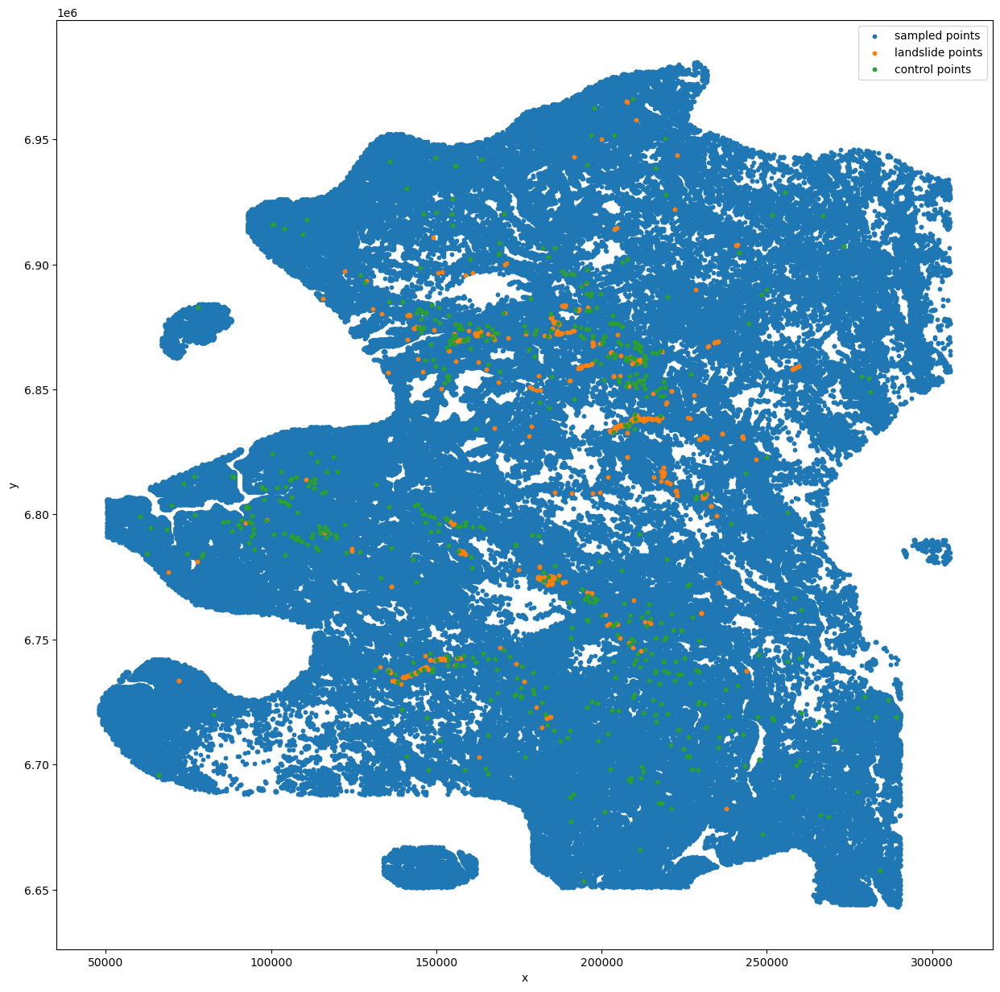

In [87]:
# plot sample together with landslide points and chosen control points

size = 10

fig,ax = plt.subplots(figsize=(15,15))

plt.scatter(sampled_points['x'], sampled_points['y'], size, label='sampled points')
plt.scatter(landslide_points['x'], landslide_points['y'], size, label='landslide points')
plt.scatter(control_points['x'], control_points['y'], size, label='control points')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()

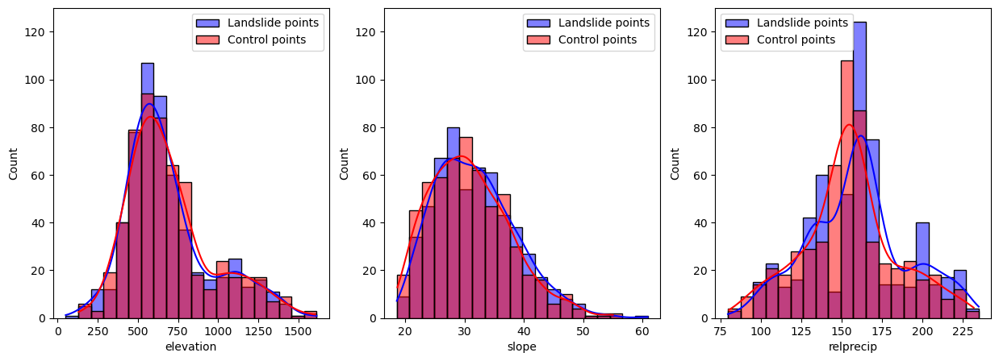

In [88]:
# plot distribution of elevation, slope and relprecip for landslide points and control points

stat = 'count' #'probability'#
nbins = 20

fig, ax = plt.subplots(1, 3, figsize=(15, 5))

sns.histplot(landslide_points['elevation'], kde=True, ax=ax[0], color='blue', bins=nbins, binrange=(elevation_min,elevation_max), stat=stat, label='Landslide points')
#sns.histplot(sampled_points['elevation'], kde=True, ax=ax[0], color='green', bins=nbins, binrange=(elevation_min,elevation_max), stat=stat, label='Sampled points')
sns.histplot(control_points['elevation'], kde=True, ax=ax[0], color='red', bins=nbins, binrange=(elevation_min,elevation_max), stat=stat, label='Control points')
ax[0].legend()
if stat == 'count':
    ax[0].set_ylim(0,130)

sns.histplot(landslide_points['slope'], kde=True, ax=ax[1], color='blue', bins=nbins, binrange=(slope_min,slope_max), stat=stat, label='Landslide points')
#sns.histplot(sampled_points['slope'], kde=True, ax=ax[1], color='green', bins=nbins, binrange=(slope_min,slope_max), stat=stat, label='Sampled points')
sns.histplot(control_points['slope'], kde=True, ax=ax[1], color='red', bins=nbins, binrange=(slope_min,slope_max), stat=stat, label='Control points')
ax[1].legend()
if stat == 'count':
    ax[1].set_ylim(0,130)

sns.histplot(landslide_points['relprecip'], kde=True, ax=ax[2], color='blue', bins=nbins, binrange=(relprecip_min,relprecip_max), stat=stat, label='Landslide points')
#sns.histplot(sampled_points['relprecip'], kde=True, ax=ax[2], color='green', bins=nbins, binrange=(relprecip_min,relprecip_max), stat=stat, label='Sampled points')
sns.histplot(control_points['relprecip'], kde=True, ax=ax[2], color='red', bins=nbins, binrange=(relprecip_min,relprecip_max), stat=stat, label='Control points')
ax[2].legend()
if stat == 'count':
    ax[2].set_ylim(0,130)

plt.show()

#plt.figure(figsize=(3, 5))
#sns.boxplot(data=landslide_points['elevation'])
#plt.show()

In [61]:
# save control points
control_points.to_csv('control_attributes.csv', index=False)


#### finally assign attributes to control points

In [44]:
#control_points = pd.read_csv('data_out/control_attributes.csv')
control_points

Index(['x', 'y', 'elevation', 'slope', 'relprecip', 'profcurv', 'aspect_sin',
       'aspect_cos', 'tri', 'tpi', 'canopy', 'treetype', 'treeheight',
       'treenumber', 'treevolume', 'groundwater', 'precip', 'flowacc', 'spi',
       'twi', 'landforms'],
      dtype='object')

In [19]:
#def get_attr_for_coords(x, y, dtm, attr):
#    att = dtm[attr].sel(x=x, y=y, method='nearest').values
#    return att

In [93]:

for attr in ['elevation','slope']:
    control_points[attr] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)
    
control_points['relprecip'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], relprecip, attr='relprecip'), axis=1)

for attr in ['profcurv', 'plancurv', 'aspect_sin', 'aspect_cos', 'tri', 'tpi']:
    control_points[attr] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)

for attr in ['canopy', 'treetype', 'treeheight', 'treenumber', 'treevolume']:
    control_points[attr] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], forest, attr=attr), axis=1)

control_points['groundwater'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], groundwater, attr='groundwater'), axis=1)
    
control_points['precip'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], precip, attr='precip'), axis=1)
control_points['max_precip_1h'] = control_points.apply(lambda row: get_attr_for_2d_coords(row['x'], row['y'], max_precip, attr='precip_1h'), axis=1)
control_points['max_precip_3h'] = control_points.apply(lambda row: get_attr_for_2d_coords(row['x'], row['y'], max_precip, attr='precip_3h'), axis=1)

for attr in ['flowacc']:
    control_points[attr] = control_points.apply(lambda row: get_max_attr_for_coords(row['x'], row['y'], flowacc, attr=attr), axis=1)

control_points['spi'] = control_points.apply(lambda row: calculate_spi(row['flowacc'], row['slope']*np.pi/180), axis=1)
control_points['twi'] = control_points.apply(lambda row: calculate_twi(row['flowacc'], row['slope']*np.pi/180), axis=1)

control_points['landforms'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], landforms, attr='landforms'), axis=1)

control_points.to_csv('control_attributes.csv', index=False)

/tmp/ipykernel_422914/281066548.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  control_points[attr] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)
/tmp/ipykernel_422914/281066548.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  control_points['relprecip'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], relprecip, attr='relprecip'), axis=1)
/tmp/ipykernel_422914/281066548.py:7: SettingWithCopyWarning: 
A value is trying t

KeyboardInterrupt: 

In [45]:
#control_points['max_precip_1h'] = control_points.apply(lambda row: get_attr_for_2d_coords(row['x'], row['y'], max_precip, attr='precip_1h'), axis=1)
#control_points['max_precip_3h'] = control_points.apply(lambda row: get_attr_for_2d_coords(row['x'], row['y'], max_precip, attr='precip_3h'), axis=1)
#control_points['plancurv'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr='plancurv'), axis=1)
#control_points.to_csv('control_attributes.csv', index=False)

In [47]:
#control_points.to_csv('control_attributes.csv', index=False)

# figures

In [38]:
landforms = xr.open_dataset('data/landforms.nc')

In [68]:
#landforms['landforms']# = landforms['landforms'][0]

In [44]:
#landforms = landforms.drop_vars('__xarray_dataarray_variable__')
#landforms['landforms']

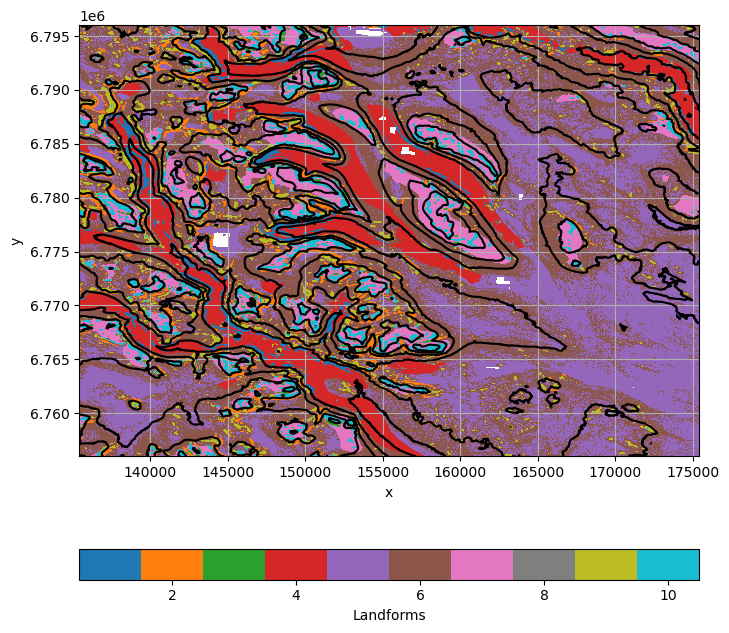

In [58]:
xx,yy = np.meshgrid(dtm['x'], dtm['y'])

indx = 100
indy = 10
xstart = 40000
xend = 48000
ystart = 20000
yend = 28000

xx = xx[xstart:xend, ystart:yend]
yy = yy[xstart:xend, ystart:yend]

plt.figure(figsize=(8, 8))
lf = plt.pcolormesh(xx, yy, landforms['landforms'].values[xstart:xend, ystart:yend], 
               vmin=0.5, vmax=10.5, cmap='tab10') #
plt.contour(xx, yy, dtm['elevation'].values[xstart:xend, ystart:yend],
            colors='k')#, cmap='terrain')
plt.colorbar(lf, orientation='horizontal', label='Landforms')
#plt.xlim(10e5, 1.5*10e5)
#plt.ylim(6.7*10e6, 6.8*10e6)
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

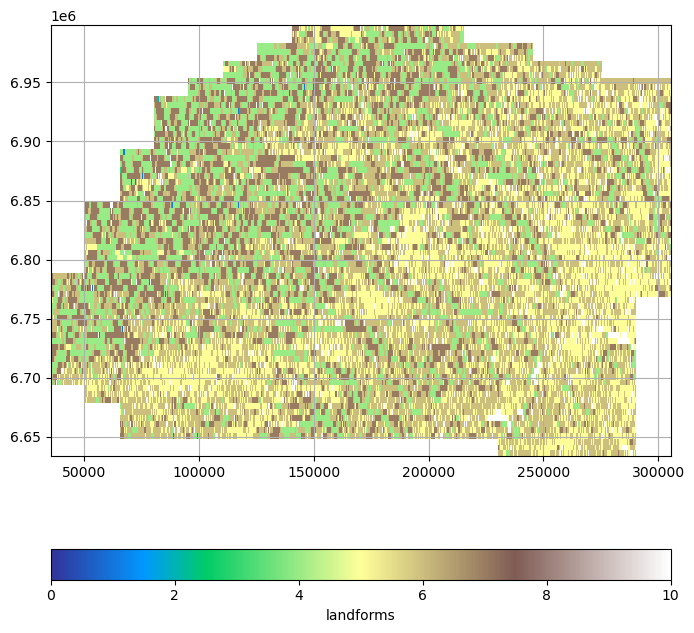

In [22]:
xx,yy = np.meshgrid(landforms['x'], landforms['y'])

indx = 100
indy = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::indx][::indy], yy[::indx][::indy], landforms[0][::indx][::indy], vmin=0, vmax=10, cmap='terrain') #
plt.colorbar(orientation='horizontal', label='landforms')
plt.grid()
plt.show()

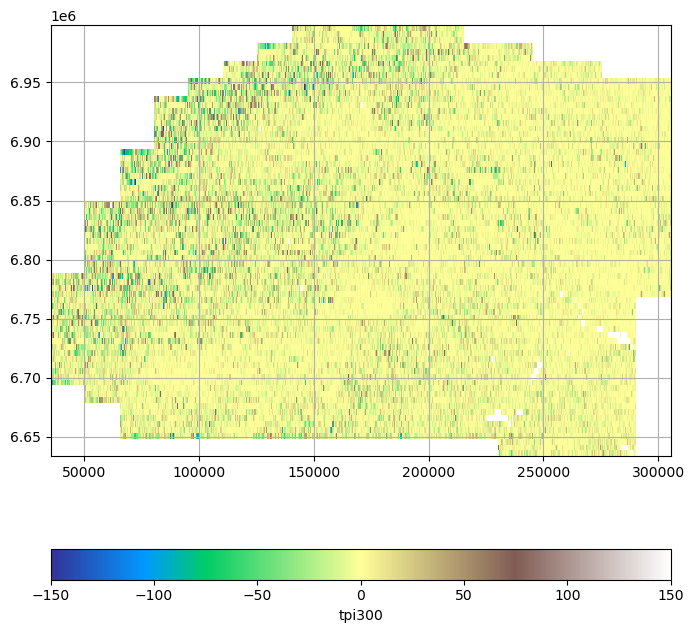

In [32]:
xx,yy = np.meshgrid(tpi300['x'], tpi300['y'])

indx = 100
indy = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::indx][::indy], yy[::indx][::indy], tpi300[0][::indx][::indy], vmin=-150, vmax=150, cmap='terrain') #
plt.colorbar(orientation='horizontal', label='tpi300')
plt.grid()
plt.show()

In [ ]:
xx,yy = np.meshgrid(landforms['x'], landforms['y'])

ind = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::ind][::ind], yy[::ind][::ind], landforms[0][::ind][::ind], cmap='terrain') #vmin=0, vmax=50, 
plt.colorbar(orientation='horizontal', label='landforms')
plt.grid()
plt.show()

In [13]:
#ds_masked_chunked = ds_filled.where(ds_filled['filled_dtm'] != -9999.)  

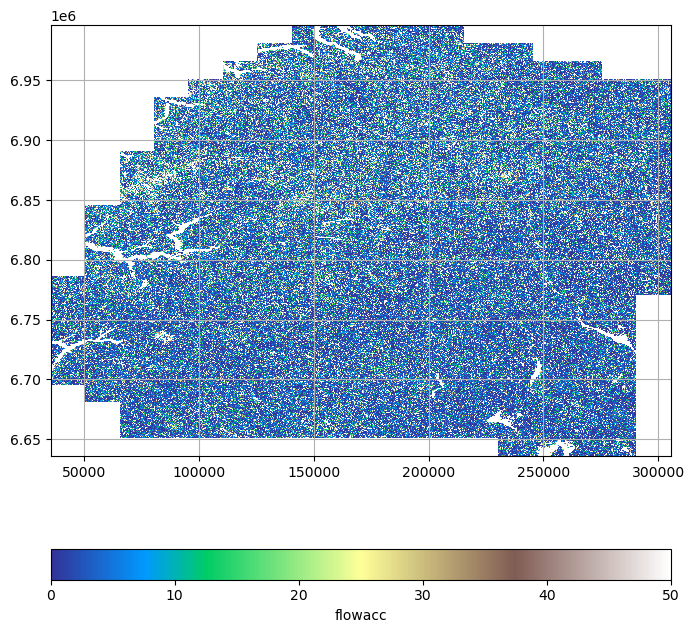

In [8]:
xx,yy = np.meshgrid(flowacc['x'], flowacc['y'])

ind = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::ind][::ind], yy[::ind][::ind], flowacc['flowacc'][::ind][::ind], vmin=0, vmax=50, cmap='terrain')
plt.colorbar(orientation='horizontal', label='flowacc')
plt.grid()
plt.show()

In [17]:
ds_masked = ds_filled.where(ds_filled['filled_dtm'] != -9999.)  

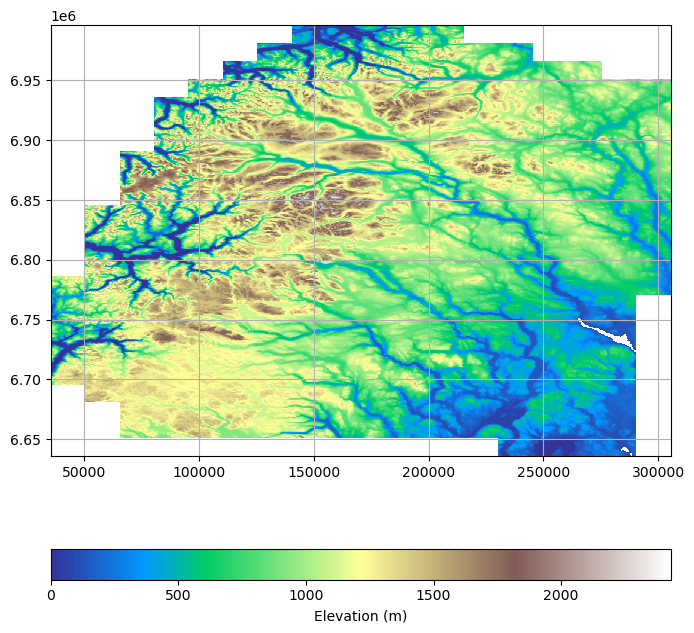

In [21]:
xx,yy = np.meshgrid(ds_filled['x'], ds_filled['y'])

ind = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::ind][::ind], yy[::ind][::ind], ds_masked['filled_dtm'][::ind][::ind], cmap='terrain')
plt.colorbar(orientation='horizontal', label='Elevation (m)')
plt.grid()
plt.show()

In [71]:
xx,yy = np.meshgrid(dtm['x'], dtm['y'])

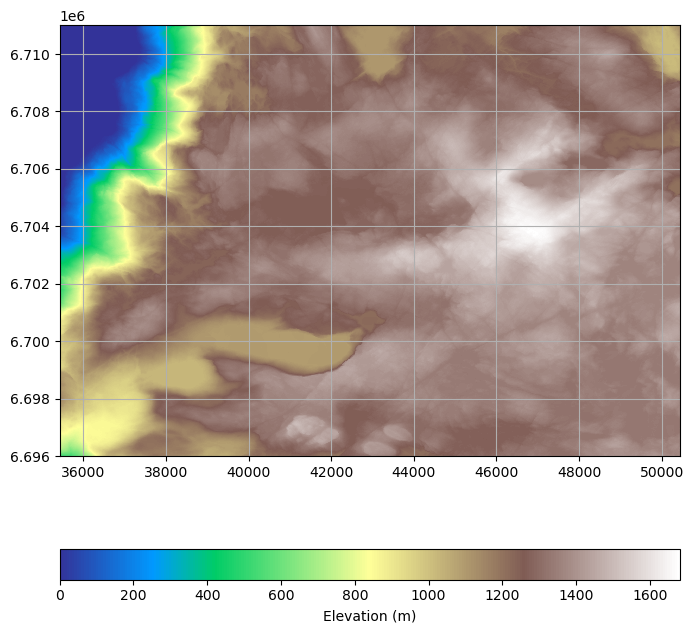

In [72]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['elevation'], cmap='terrain')
plt.colorbar(orientation='horizontal', label='Elevation (m)')
#plt.title("Downsampled DTM Visualization")
plt.grid()
plt.show()

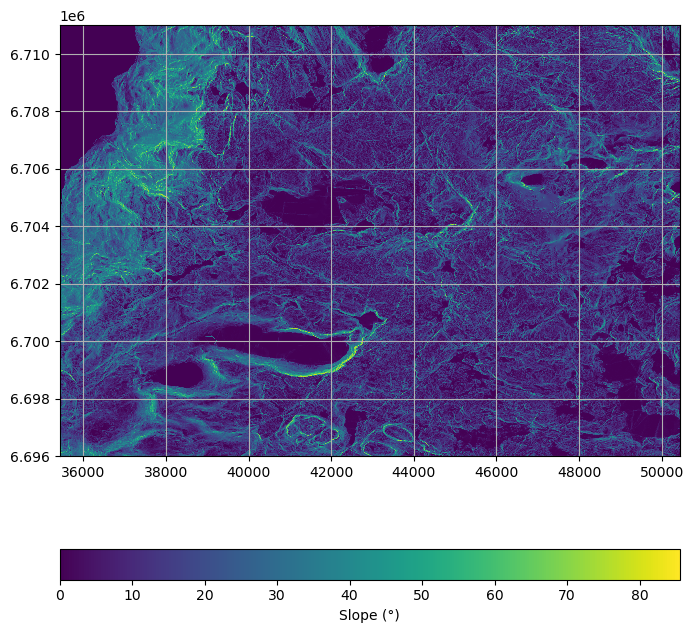

In [78]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['slope'])#, vmax=2, cmap='terrain')
plt.colorbar(orientation='horizontal', label='Slope (\u00b0)')
plt.grid()
plt.show()

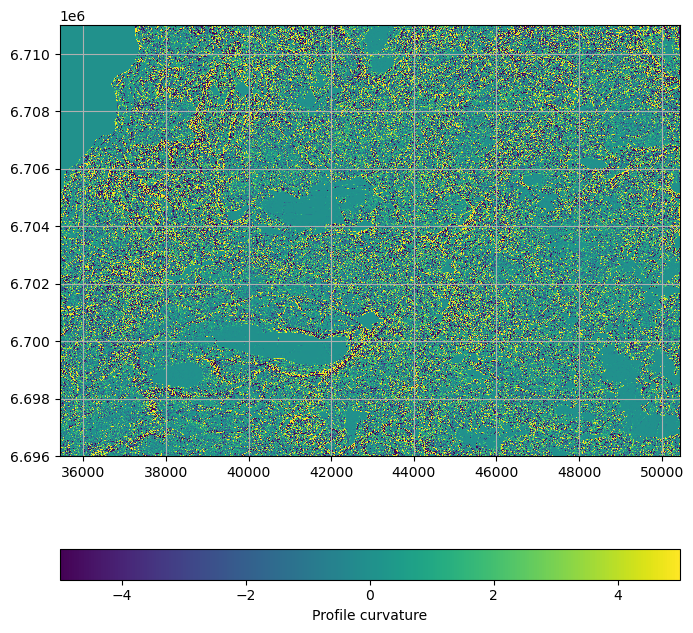

In [106]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['profcurv'], vmin=-5, vmax=5)
plt.colorbar(orientation='horizontal', label='Profile curvature')
plt.grid()
plt.show()

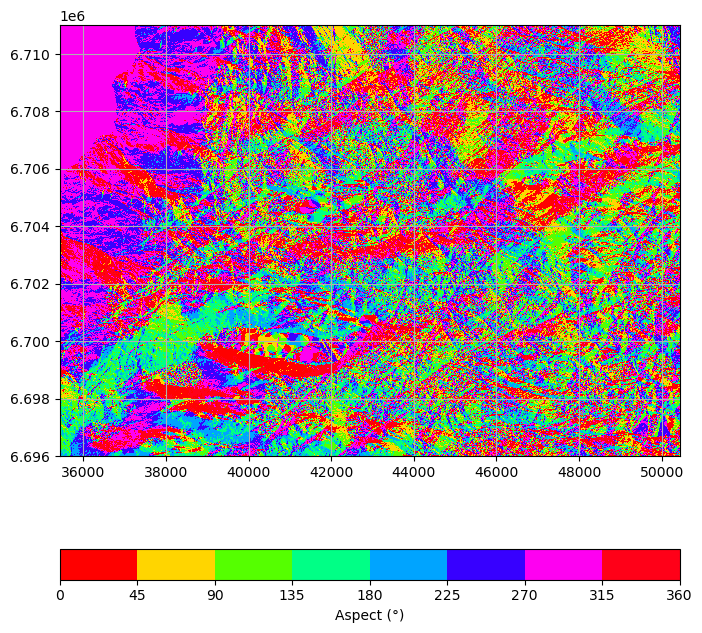

In [74]:
n_bins = 8
cmap = plt.get_cmap('hsv')
bounds = np.linspace(np.min(aspect), np.max(aspect), n_bins + 1)
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=cmap.N)

plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, aspect, norm=norm, cmap=cmap)#twilight')
plt.colorbar(orientation='horizontal', label='Aspect (\u00b0)')
plt.grid()
plt.show()

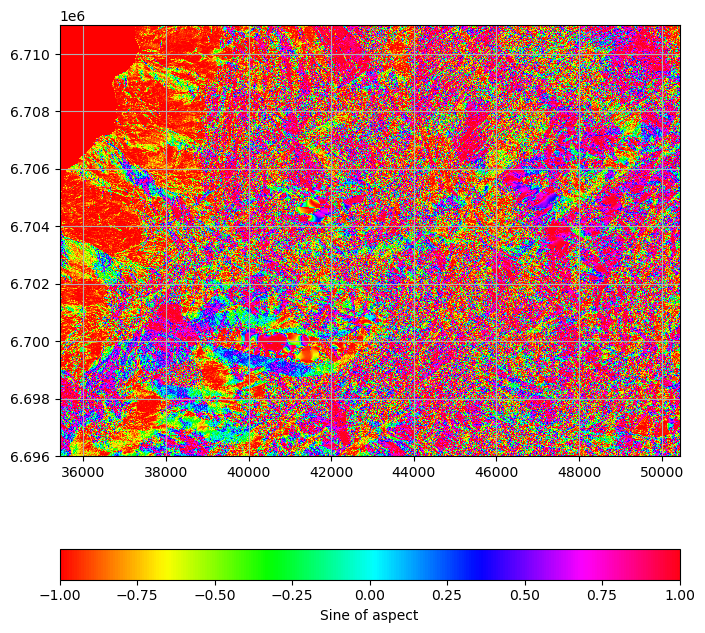

In [75]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['aspect_sin'], cmap=cmap)#twilight')
plt.colorbar(orientation='horizontal', label='Sine of aspect')
plt.grid()
plt.show()

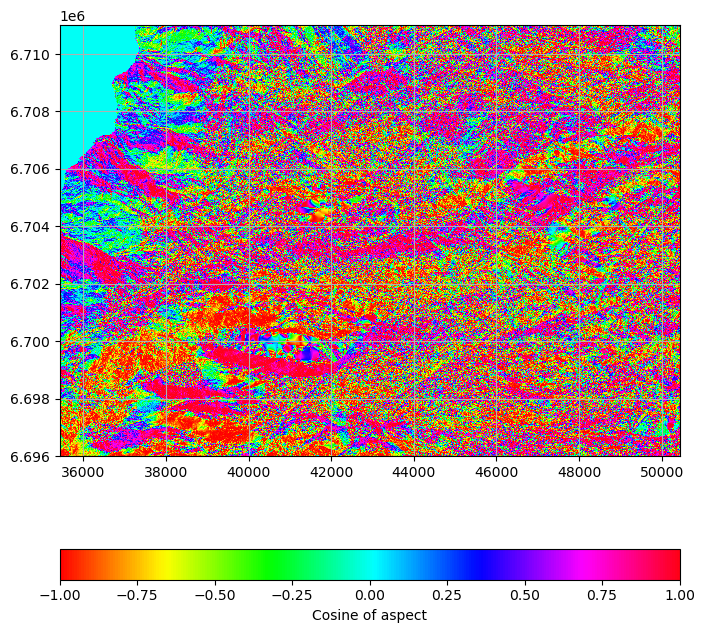

In [76]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['aspect_cos'], cmap=cmap)#twilight')
plt.colorbar(orientation='horizontal', label='Cosine of aspect')
plt.grid()
plt.show()

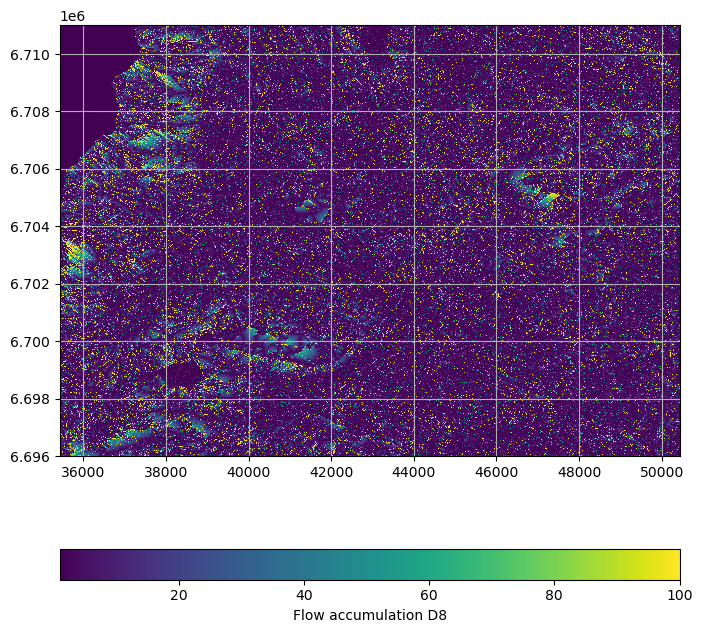

In [80]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['flowacc'], vmax=100, cmap='viridis')
plt.colorbar(orientation='horizontal', label='Flow accumulation D8')
plt.grid()
plt.show()

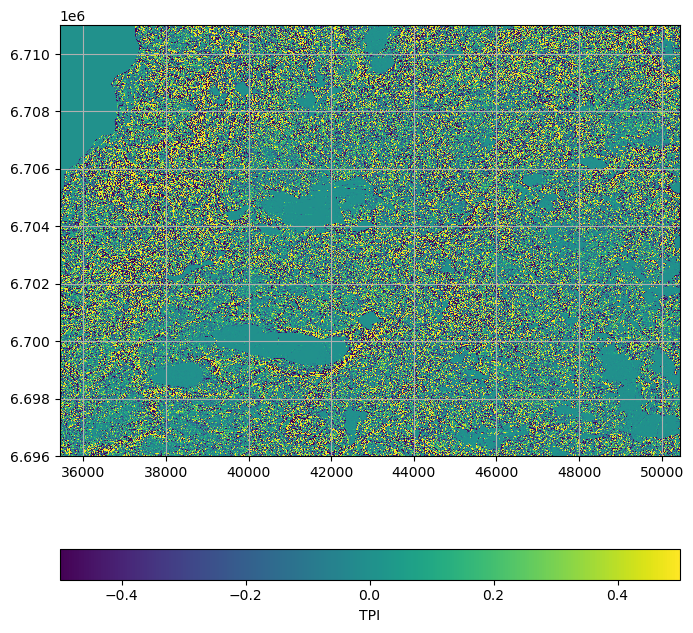

In [90]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['tpi'], vmin=-.5, vmax=.5)#, cmap='terrain')
plt.colorbar(orientation='horizontal', label='TPI')
plt.grid()
plt.show()

In [85]:
dtm['tpi'].min(), dtm['tpi'].max()

(<xarray.DataArray 'tpi' ()> Size: 4B
 array(-27.982788, dtype=float32)
 Coordinates:
     band         int64 8B 1
     spatial_ref  int64 8B 0,
 <xarray.DataArray 'tpi' ()> Size: 4B
 array(26.492065, dtype=float32)
 Coordinates:
     band         int64 8B 1
     spatial_ref  int64 8B 0)

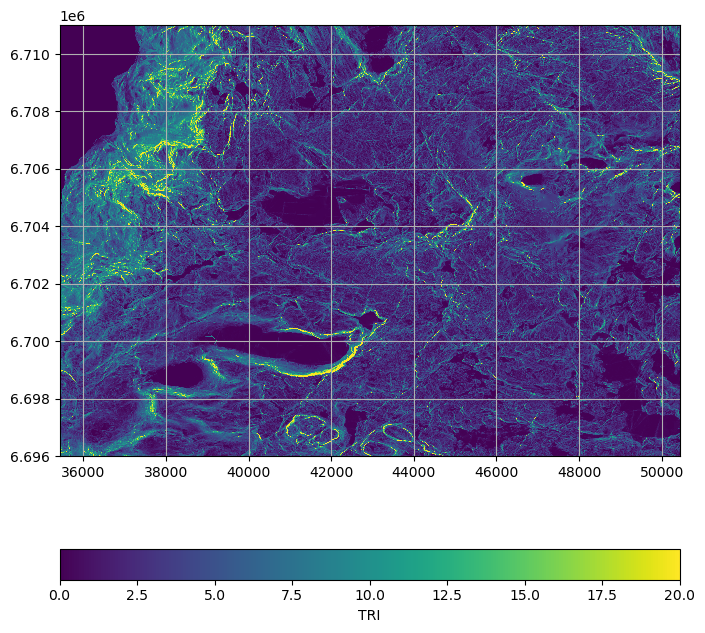

In [91]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['tri'], vmax=20)#, cmap='terrain')
plt.colorbar(orientation='horizontal', label='TRI')
plt.grid()
plt.show()

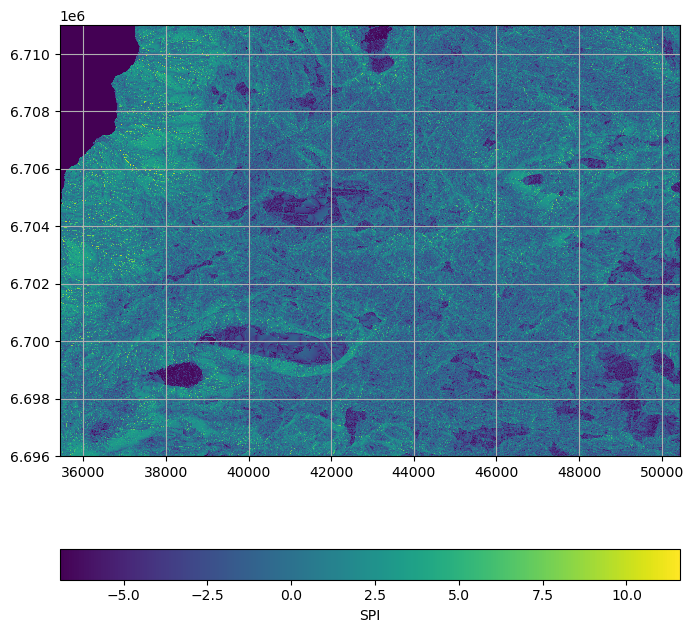

In [84]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['spi'])#, vmax=2, cmap='terrain')
plt.colorbar(orientation='horizontal', label='SPI')
plt.grid()
plt.show()

### plot treetype, canopy

In [32]:
forest = forest.where(forest != -9999, np.nan)

In [34]:
xx_sr, yy_sr = np.meshgrid(forest['x'], forest['y'])

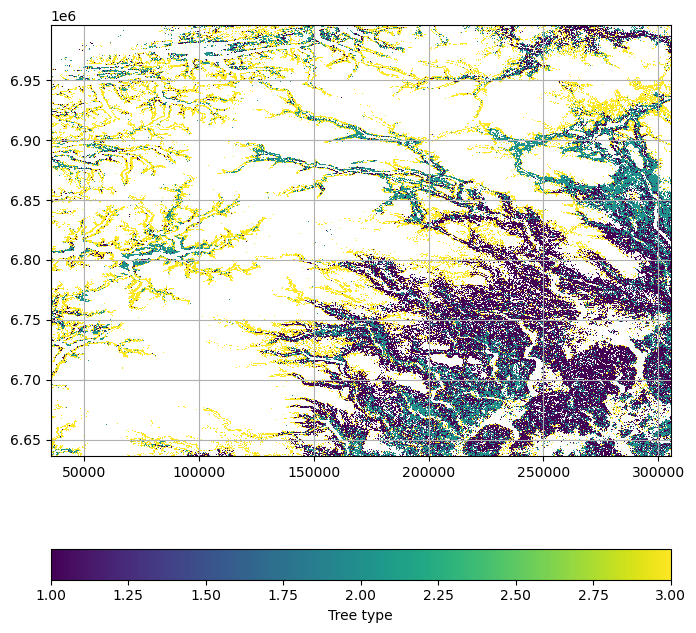

In [37]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_sr, yy_sr, forest['treetype'])#, vmax=100, cmap='viridis')
plt.colorbar(orientation='horizontal', label='Tree type')
plt.grid()
plt.show()

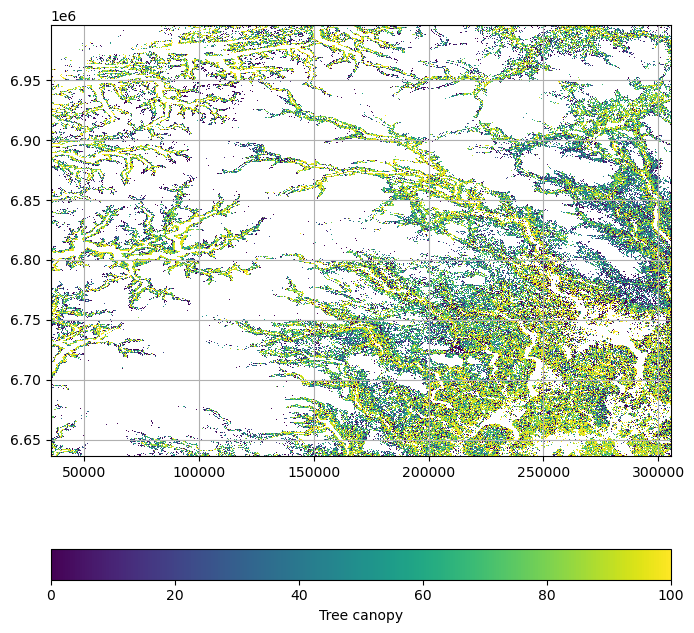

In [38]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_sr, yy_sr, forest['canopy'])#, vmax=100, cmap='viridis')
plt.colorbar(orientation='horizontal', label='Tree canopy (%)')
plt.grid()
plt.show()

### plot ground water

In [95]:
xx_gw, yy_gw = np.meshgrid(groundwater['x'], groundwater['y'])

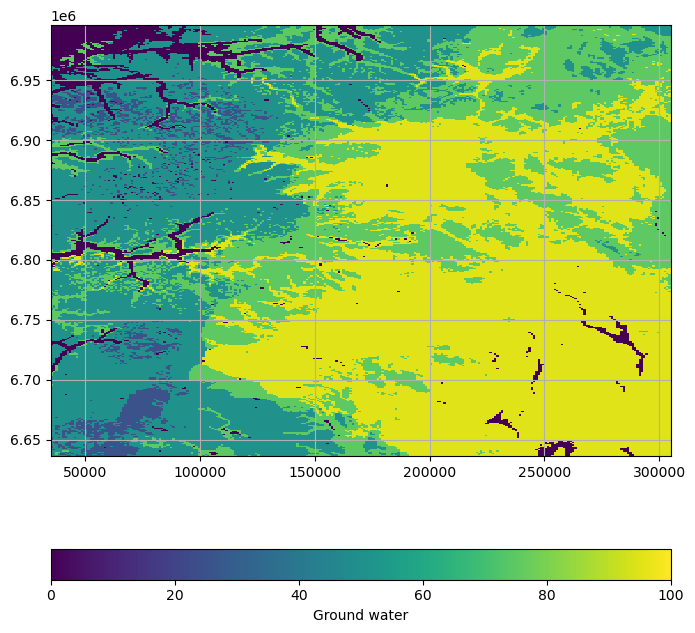

In [97]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_gw, yy_gw, groundwater, vmax=100)#, cmap='viridis')
plt.colorbar(orientation='horizontal', label='Ground water')
plt.grid()
plt.show()

### plot precipitation

In [11]:
xx_p, yy_p = np.meshgrid(precip['x'], precip['y'])

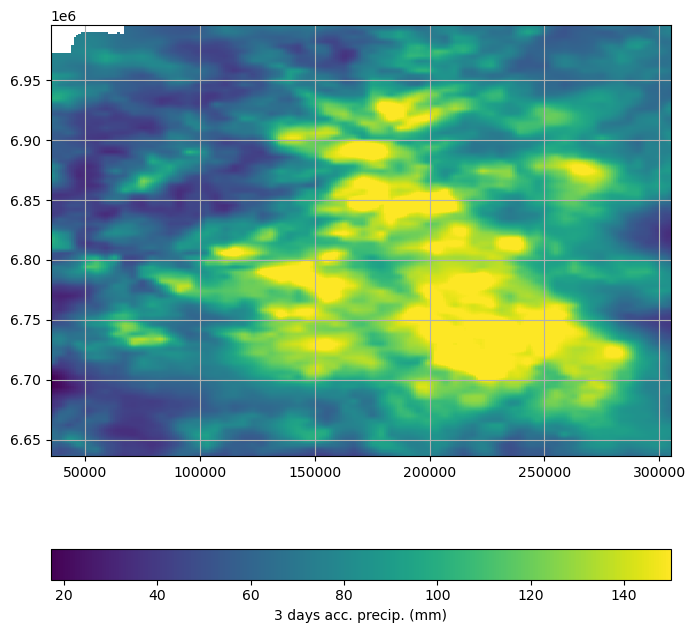

In [44]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_p, yy_p, precip, vmax=150, cmap='viridis')
plt.colorbar(orientation='horizontal', label='3 days acc. precip. (mm)')
plt.grid()
plt.show()

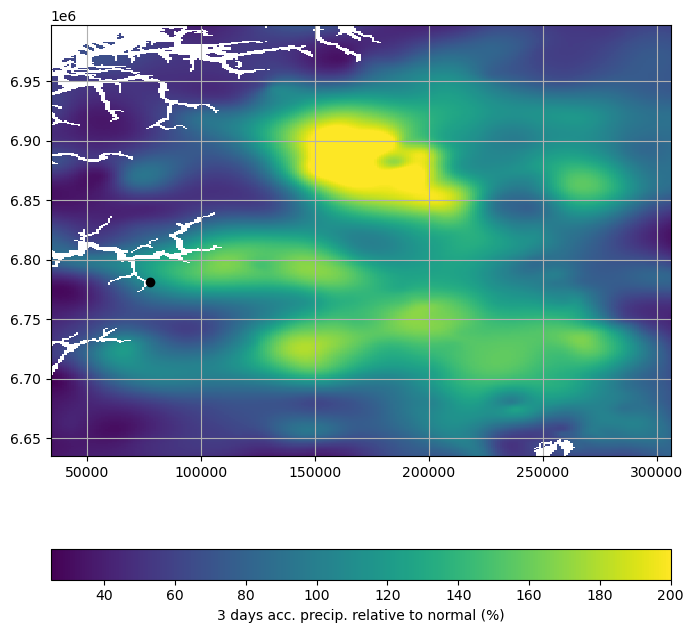

In [57]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_p, yy_p, relprecip['relprecip'], vmax=200, cmap='viridis')
plt.colorbar(orientation='horizontal', label='3 days acc. precip. relative to normal (%)')
plt.scatter(landslide_points.iloc[18]['x'], landslide_points.iloc[18]['y'], marker='o', facecolor='k')
plt.grid()
plt.show()

In [21]:
xp,yp


(167684.092427, 6869836.0)

/tmp/ipykernel_3370678/2844455805.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(max_precip['x'], max_precip['y'], max_precip['precip_1h'], vmax=15, cmap='viridis')#, ec='k')


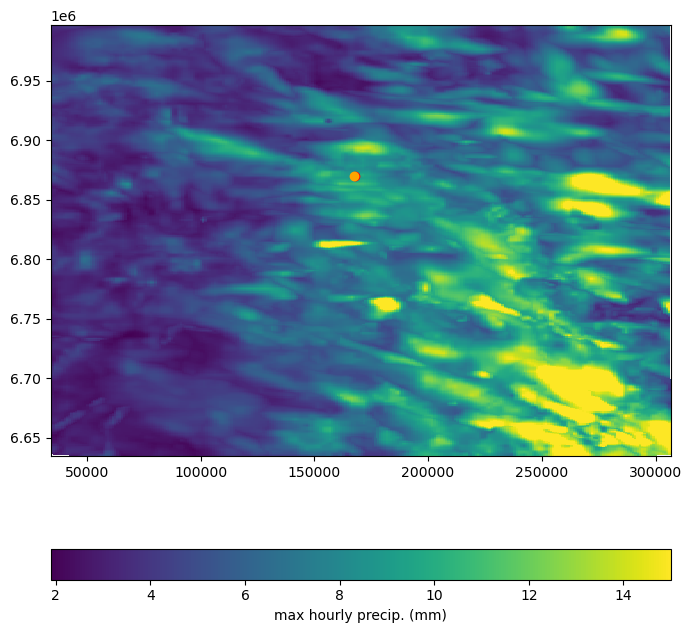

In [32]:
#xx_p, yy_p = np.meshgrid(precip_1h['x'], precip_1h['y'])

plt.figure(figsize=(8, 8))
plt.pcolormesh(max_precip['x'], max_precip['y'], max_precip['precip_1h'], vmax=15, cmap='viridis')#, ec='k')
plt.colorbar(orientation='horizontal', label='max hourly precip. (mm)')
plt.scatter(xp, yp, c='r')
plt.scatter(max_precip['x'][i,j].values, max_precip['y'][i,j].values, c='orange')
#plt.scatter(landslide_points.iloc[18]['x'], landslide_points.iloc[18]['y'], marker='o', facecolor='k')
#plt.xlim(160000,170000)
#plt.ylim(6.86*10**6,6.88*10**6)
#plt.grid()
plt.show()

In [45]:
max_precip['y']

<xarray.DataArray 'y' (y: 361, x: 271)> Size: 783kB
array([[6634978.87637225, 6634982.556801  , 6634986.22882723, ...,
        6635672.55666775, 6635674.06990971, 6635675.57530853],
       [6635981.33341722, 6635985.00363372, 6635988.66546961, ...,
        6636673.06307591, 6636674.57200417, 6636676.0731114 ],
       [6636983.80068695, 6636987.46068825, 6636991.11233083, ...,
        6637673.57914018, 6637675.08375347, 6637676.58056785],
       ...,
       [6994339.14901327, 6994338.97547012, 6994338.80177299, ...,
        6994296.40843717, 6994296.29251534, 6994296.17709347],
       [6995343.79796373, 6995343.61307059, 6995343.42804771, ...,
        6995298.88769699, 6995298.76697313, 6995298.64677381],
       [6996348.44876581, 6996348.25251922, 6996348.05616715, ...,
        6996301.36814481, 6996301.24261744, 6996301.1176392 ]])
Coordinates:
    latitude   (y, x) float32 391kB 59.59 59.59 59.6 59.6 ... 63.04 63.04 63.04
    longitude  (y, x) float32 391kB 6.757 6.775 6.792 6.81 ... 11.12 11.14 11.16
    x          (y, x) float64 783kB 3.537e+04 3.637e+04 ... 3.049e+05 3.059e+05
    y          (y, x) float64 783kB 6.635e+06 6.635e+06 ... 6.996e+06 6.996e+06
    band       int64 8B 1

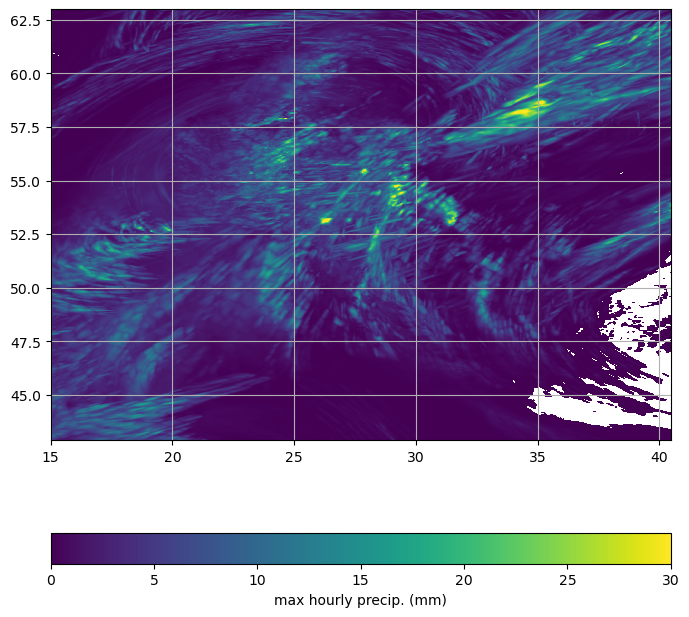

In [17]:
xx_p, yy_p = np.meshgrid(precip_1h['x'], precip_1h['y'])

plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_p, yy_p, precip_1h['precip_1h'][0], vmax=30, cmap='viridis')
plt.colorbar(orientation='horizontal', label='max hourly precip. (mm)')
#plt.scatter(landslide_points.iloc[18]['x'], landslide_points.iloc[18]['y'], marker='o', facecolor='k')
plt.grid()
plt.show()

In [96]:

precip_1h = rioxarray.open_rasterio('data_out/max_precip_1h.tif')
precip_1h = precip_1h.where(precip_1h[0] > 0, np.nan)

# define x,y increments to include x,y values one cell outside the dtm
#xstep = abs((precip_1h['x'][1]-precip_1h['x'][0]).values)
#ystep = abs((precip_1h['y'][1]-precip_1h['y'][0]).values)
#
# extract subset similar to dtm domain
#precip_1h = precip_1h[0].where((precip_1h.x >= dtm['x'].min()-xstep) & (precip_1h.y >= dtm['y'].min()-ystep) 
#                             & (precip_1h.x <= dtm['x'].max()+xstep) & (precip_1h.y <= dtm['y'].max()+ystep), drop=True)

precip_1h = xr.Dataset({'precip_1h': precip_1h[0]})

In [41]:
precip_1h['y']


<xarray.DataArray 'y' (y: 2321)> Size: 19kB
array([5875217.433531, 5874223.233105, 5873229.032679, ..., 3570660.846373,
       3569666.645947, 3568672.445522])
Coordinates:
    band         int64 8B 1
  * y            (y) float64 19kB 5.875e+06 5.874e+06 ... 3.57e+06 3.569e+06
    spatial_ref  int64 8B 0

In [ ]:
(6.6-7)*10^6
(0.5-30)*10^5